# Urban Obstacle Detection: Comprehensive EDA (Exploratory Data Analysis) and Dataset Insights

This notebook presents an exploratory analysis of the ROD-Dataset, a real-world urban obstacle detection benchmark for pedestrian safety and assistive-vision applications.

The analysis examines:

- Dataset composition across 24,326 images and 25 object classes
- Class distributions and long-tail imbalance
- Annotation counts across train, validation, and test splits
- Objects per image and scene complexity
- Bounding-box geometry, scale, and aspect ratios
- Spatial distributions of object centers
- Image brightness and visual diversity
- Image-label integrity and duplicate pairing checks
- Qualitative samples with bounding boxes and segmentation polygons
- Baseline predictions from a pretrained YOLO model

The dataset contains 40,195 annotated objects, with Person and Car as the most frequent classes. Object frequency is highly imbalanced: the most common class has approximately 36.7 times more annotations than the rarest class. Images contain an average of 1.65 objects, while some scenes contain up to 94 objects.

Bounding-box analysis shows substantial variation in object size and shape, supporting the need for models that can handle both small distant obstacles and large foreground objects. Spatial analysis also reveals predictable placement patterns associated with pedestrian viewpoints.

All 24,326 images have matching label files across the train, validation, and test splits, with no missing or orphan labels detected. Overall, the dataset provides a strong foundation for research in urban obstacle detection, assistive navigation, and real-time mobile computer vision.


In [1]:
# Import standard-library modules
import os       # File and directory path operations
import random   # Random sampling for visualizing dataset examples

# Import third-party libraries
import cv2      # Image loading and computer vision operations
import yaml     # Reading dataset metadata from YAML files
import numpy as np
import pandas as pd

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns


# Configure visualization styles for clearer plots
plt.style.use("ggplot")
sns.set_context("talk")


# Root directory containing the dataset
# Expected structure:
# dataset/
# ├── data.yaml
# ├── class_distribution.csv
# ├── images_manifest.csv
# ├── train/
# ├── valid/
# └── test/
DATASET_ROOT = "dataset"

# Display the dataset location to confirm the configured path
print(f"Dataset root directory: {DATASET_ROOT}")


Dataset root directory: dataset



# Dataset Metadata


In [2]:
# Load the dataset configuration file.
# The YAML file typically contains the dataset paths, class names,
# and the total number of object-detection categories.
with open(f"{DATASET_ROOT}/data.yaml", "r") as f:
    data_yaml = yaml.safe_load(f)

# Display the parsed YAML content as a Python dictionary.
# The class names loaded here are used later when visualizing annotations.
# Confirm that the configuration was loaded successfully.
print("Dataset configuration loaded successfully.")

# Show the main dataset path, if it is defined in the YAML file.
print(f"Dataset path: {data_yaml.get('path', 'Not specified')}")

# Display the dataset split locations.
for split in ("train", "val", "test"):
    if split in data_yaml:
        print(f"{split.capitalize()} data: {data_yaml[split]}")

# Display the number and names of detection classes.
class_names = data_yaml.get("names", [])
print(f"Number of classes: {len(class_names)}")
print("Classes:")

if isinstance(class_names, dict):
    for class_id, class_name in class_names.items():
        print(f"  {class_id}: {class_name}")
else:
    for class_id, class_name in enumerate(class_names):
        print(f"  {class_id}: {class_name}")



Dataset configuration loaded successfully.
Dataset path: Not specified
Train data: ../train/images
Val data: ../valid/images
Test data: ../test/images
Number of classes: 25
Classes:
  0: Bike
  1: Building
  2: Car
  3: Person
  4: Stairs
  5: Traffic sign
  6: Electrical Pole
  7: Road
  8: Motorcycle
  9: Dustbin
  10: Dog
  11: Manhole
  12: Tree
  13: Guard rail
  14: Pedestrian crosswalk
  15: Truck
  16: Bus
  17: Bench
  18: Traffic Cone
  19: Fire hydrant
  20: Teraffic Barrel
  21: Plant Pot
  22: Electrical Box
  23: Chair
  24: Bicycle Rack



# Load Supporting Tables


In [3]:
# Load supporting CSV files containing dataset-level metadata.
# These tables are used by later cells for class distribution and image-level analysis.

# Load per-class statistics, such as class names and object counts by split.
class_df = pd.read_csv(f"{DATASET_ROOT}/class_distribution.csv")

# Load per-image metadata, such as image names and the number of annotated objects.
manifest_df = pd.read_csv(f"{DATASET_ROOT}/images_manifest.csv")

# Report the dimensions of each table.
# The shape is returned as (number of rows, number of columns).
print("Supporting tables loaded successfully.\n")
print(f"Class distribution table: {class_df.shape[0]} rows × {class_df.shape[1]} columns")
print(f"Image manifest table:     {manifest_df.shape[0]} rows × {manifest_df.shape[1]} columns")

# Display the available columns so their contents can be understood.
print("\nClass distribution columns:")
print(list(class_df.columns))

print("\nImage manifest columns:")
print(list(manifest_df.columns))

# Preview all class records.
# Each row should represent one detection category.
print("\nClass Distribution Preview:")
class_ratio_df = class_df[class_df["class_id"].notna()].copy()

class_ratio_df["Train (%)"] = (
    class_ratio_df["train"] / class_ratio_df["total"] * 100
).round(2)

class_ratio_df["Valid (%)"] = (
    class_ratio_df["valid"] / class_ratio_df["total"] * 100
).round(2)

class_ratio_df["Test (%)"] = (
    class_ratio_df["test"] / class_ratio_df["total"] * 100
).round(2)

display_df = class_ratio_df[["class_name", "total", "train", "Train (%)", "valid", "Valid (%)", "test", "Test (%)"]].copy()

for split in ["Train", "Valid", "Test"]:
    display_df[split] = (
        display_df[split.lower()].astype(str)
        + " ("
        + display_df[f"{split} (%)"].map("{:.2f}%".format)
        + ")"
    )

display(
    display_df[["class_name", "total", "Train", "Valid", "Test"]]
)

# Preview the first five image records.
# Each row should represent one image and its associated metadata.
print("\nImage Manifest Preview:")
display(manifest_df.head())

# Provide a quick interpretation of the loaded data.
print("\nInterpretation:")
print(f"- The class table contains statistics for {class_df.shape[0]} classes.")
print(f"- The image manifest contains metadata for {manifest_df.shape[0]} images.")
print("- These tables will support dataset summaries, class-balance plots, and image-level analysis.")


Supporting tables loaded successfully.

Class distribution table: 26 rows × 6 columns
Image manifest table:     24326 rows × 6 columns

Class distribution columns:
['class_id', 'class_name', 'train', 'valid', 'test', 'total']

Image manifest columns:
['split', 'image_filename', 'label_filename', 'num_objects', 'classes_present', 'class_names_present']

Class Distribution Preview:


,class_name,total,Train,Valid,Test
0,Bike,467,323 (69.16%),95 (20.34%),49 (10.49%)
1,Building,1041,886 (85.11%),101 (9.70%),54 (5.19%)
2,Car,5578,4328 (77.59%),1003 (17.98%),247 (4.43%)
3,Person,8962,7609 (84.90%),1033 (11.53%),320 (3.57%)
4,Stairs,1687,1125 (66.69%),339 (20.09%),223 (13.22%)
5,Traffic sign,907,689 (75.96%),114 (12.57%),104 (11.47%)
6,Electrical Pole,618,491 (79.45%),85 (13.75%),42 (6.80%)
7,Road,682,561 (82.26%),84 (12.32%),37 (5.43%)
8,Motorcycle,1007,888 (88.18%),82 (8.14%),37 (3.67%)
9,Dustbin,1549,1351 (87.22%),153 (9.88%),45 (2.91%)



Image Manifest Preview:


,split,image_filename,label_filename,num_objects,classes_present,class_names_present
0,train,IMG_00001.jpg,IMG_00001.txt,1,2,Car
1,train,IMG_00002.jpg,IMG_00002.txt,1,2,Car
2,train,IMG_00003.jpg,IMG_00003.txt,2,2,Car
3,train,IMG_00004.jpg,IMG_00004.txt,1,2,Car
4,train,IMG_00005.jpg,IMG_00005.txt,1,2,Car



Interpretation:
- The class table contains statistics for 26 classes.
- The image manifest contains metadata for 24326 images.
- These tables will support dataset summaries, class-balance plots, and image-level analysis.



# Dataset Overview and Quality Checks


In [4]:
# Exclude the summary row ("TOTAL") when calculating the number of classes.
# The TOTAL row contains aggregate object counts, not an additional class.
class_rows = class_df[class_df["class_id"].notna()].copy()

# Build a concise dataset summary using the already loaded tables.
summary = {
    "Total Images": len(manifest_df),
    "Total Classes": class_rows["class_name"].nunique(),
    "Train Objects": class_rows["train"].sum(),
    "Valid Objects": class_rows["valid"].sum(),
    "Test Objects": class_rows["test"].sum(),
}

# Convert the summary dictionary into a readable table.
summary_df = pd.DataFrame(
    summary.items(),
    columns=["Metric", "Value"]
)

# Format object counts with their percentage of all annotated objects.
formatted_summary_df = summary_df.copy()

object_metrics = ["Train Objects", "Valid Objects", "Test Objects"]
object_total = summary_df.loc[
    summary_df["Metric"].isin(object_metrics), "Value"
].sum()

mask = formatted_summary_df["Metric"].isin(object_metrics)


# Initialize the new column with a string version of the original values
formatted_summary_df["Value_Formatted"] = formatted_summary_df["Value"].astype(str)

# Apply the percentage formatting only to the masked rows
formatted_summary_df.loc[mask, "Value_Formatted"] = formatted_summary_df.loc[mask].apply(
    lambda row: f"{row['Value']:,} ({row['Value'] / object_total * 100:.2f}%)",
    axis=1
)

display(formatted_summary_df)

# Print an interpretation of the summary values.
total_objects = summary_df.loc[
    summary_df["Metric"].isin(
        ["Train Objects", "Valid Objects", "Test Objects"]
    ),
    "Value"
].sum()

print("\nDataset Summary Interpretation:")
print(f"- The dataset contains {summary['Total Images']:,} images.")
print(f"- It includes {summary['Total Classes']} object-detection classes.")
print(f"- The dataset contains {total_objects:,} annotated objects in total.")
print(f"- Training contains {summary['Train Objects']:,} objects.")
print(f"- Validation contains {summary['Valid Objects']:,} objects.")
print(f"- Testing contains {summary['Test Objects']:,} objects.")
print("- The TOTAL row was excluded from the class count and object calculations.")


,Metric,Value,Value_Formatted
0,Total Images,24326,24326
1,Total Classes,25,25
2,Train Objects,32251,"32,251 (80.24%)"
3,Valid Objects,5572,"5,572 (13.86%)"
4,Test Objects,2372,"2,372 (5.90%)"



Dataset Summary Interpretation:
- The dataset contains 24,326 images.
- It includes 25 object-detection classes.
- The dataset contains 40,195 annotated objects in total.
- Training contains 32,251 objects.
- Validation contains 5,572 objects.
- Testing contains 2,372 objects.
- The TOTAL row was excluded from the class count and object calculations.


### Observations

- The dataset contains 24,326 images distributed across train, validation, and test splits.
- More than forty thousand annotated objects are available, providing sufficient scale for modern object detection models.
- The benchmark covers a diverse collection of urban obstacles and pedestrian-relevant objects.
- The overall dataset size is large enough to support both lightweight mobile detectors and larger research-oriented architectures.



# Class Distribution Analysis


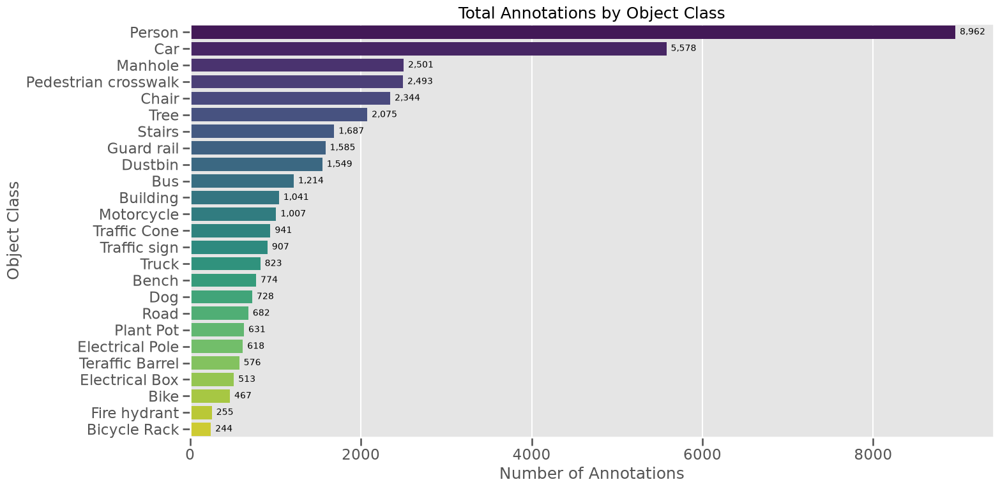

Chart Interpretation:
- Person is the most frequent class with 8,962 annotations.
- Bicycle Rack is the least frequent class with 244 annotations.
- The three most common classes account for 42.40% of all annotations.
- The most frequent class has approximately 36.7 times more annotations than the least frequent class.
- The results confirm a long-tail class distribution. Rare classes may benefit from class-balanced sampling, targeted augmentation, or weighted training.


In [5]:
# Remove the aggregate "TOTAL" row because it is not an individual class.
# The class_id column is missing for this summary row.
plot_df = (
    class_df[class_df["class_id"].notna()]
    # Sort from the most frequent class to the least frequent class.
    .sort_values("total", ascending=False)
    .copy()
)

# Create a horizontal bar chart so long class names remain readable.
plt.figure(figsize=(16, 8))

ax = sns.barplot(
    data=plot_df,
    x="total",
    y="class_name",
    hue="class_name",
    palette="viridis",
    legend=False
)

# Add descriptive labels and a chart title.
plt.title("Total Annotations by Object Class", fontsize=18)
plt.xlabel("Number of Annotations")
plt.ylabel("Object Class")

# Add the annotation count at the end of every bar.
for bar in ax.patches:
    # The bar width represents the total number of annotations.
    value = int(bar.get_width())

    ax.annotate(
        f"{value:,}",
        # Position the label at the right edge and vertical center of the bar.
        (value, bar.get_y() + bar.get_height() / 2),
        # Move the text slightly to the right of the bar.
        xytext=(5, 0),
        textcoords="offset points",
        va="center",
        fontsize=10
    )

# Adjust spacing so labels and titles do not overlap.
plt.tight_layout()
plt.show()

# Calculate statistics used to summarize the class imbalance.
total_annotations = plot_df["total"].sum()
top_class = plot_df.iloc[0]
bottom_class = plot_df.iloc[-1]

# Calculate the contribution of the three most frequent classes.
top_three = plot_df.head(3)["total"].sum()
top_three_percentage = top_three / total_annotations * 100

# Compare the most frequent class with the least frequent class.
imbalance_ratio = top_class["total"] / bottom_class["total"]

# Print a concise interpretation of the chart.
print("Chart Interpretation:")
print(
    f"- {top_class['class_name']} is the most frequent class with "
    f"{int(top_class['total']):,} annotations."
)
print(
    f"- {bottom_class['class_name']} is the least frequent class with "
    f"{int(bottom_class['total']):,} annotations."
)
print(
    f"- The three most common classes account for "
    f"{top_three_percentage:.2f}% of all annotations."
)
print(
    f"- The most frequent class has approximately "
    f"{imbalance_ratio:.1f} times more annotations than the least frequent class."
)
print(
    "- The results confirm a long-tail class distribution. "
    "Rare classes may benefit from class-balanced sampling, "
    "targeted augmentation, or weighted training."
)


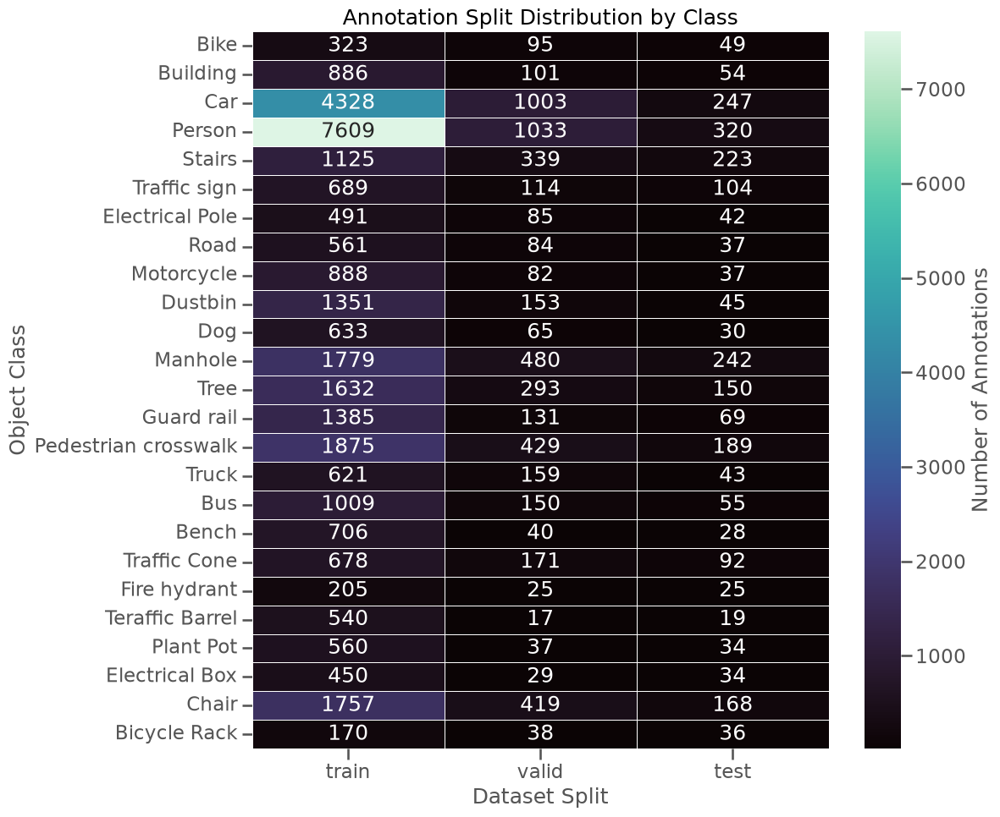

Heatmap Interpretation:
- The dataset contains 40,195 annotations across 25 object classes.
- Train: 32,251 annotations (80.24%).
- Valid: 5,572 annotations (13.86%).
- Test: 2,372 annotations (5.90%).
- The train split contains the most 'Person' annotations (7,609).
- The valid split contains the most 'Person' annotations (1,033).
- The test split contains the most 'Person' annotations (320).
- Darker cells represent classes with more annotations, while lighter cells indicate less frequent classes.
- Frequent categories such as Person and Car have substantially more annotations than rare classes such as Bicycle Rack and Fire hydrant.
- Excluding the TOTAL row prevents aggregate values from distorting the class-level visualization.


In [6]:
# Exclude the aggregate TOTAL row.
# The TOTAL row has a missing class_id and would distort the class-level heatmap.
heatmap_df = class_df[class_df["class_id"].notna()].copy()

# Keep only annotation counts for the three dataset splits.
# Use class names as row labels for easier interpretation.
heatmap_df = heatmap_df.set_index("class_name")[["train", "valid", "test"]]

# Create a large figure so all 25 object classes remain readable.
plt.figure(figsize=(12, 10))

# Display annotation counts for each class and split.
# Darker cells represent higher annotation counts.
sns.heatmap(
    heatmap_df,
    annot=True,                       # Show the count inside every cell
    fmt="d",                          # Format counts as integers
    cmap="mako",                      # Use a sequential color palette
    linewidths=0.5,                   # Add borders between cells
    cbar_kws={"label": "Number of Annotations"}
)

# Add descriptive labels to the visualization.
plt.title("Annotation Split Distribution by Class")
plt.xlabel("Dataset Split")
plt.ylabel("Object Class")

# Prevent labels from being clipped.
plt.tight_layout()
plt.show()

# Sum annotations across all classes for each dataset split.
split_totals = heatmap_df.sum()

# Calculate the total number of annotations represented in the heatmap.
total_annotations_heatmap = split_totals.sum()

print("Heatmap Interpretation:")
print(
    f"- The dataset contains {total_annotations_heatmap:,} annotations "
    f"across {len(heatmap_df)} object classes."
)

# Report the annotation count and percentage for each split.
for split_name, count in split_totals.items():
    percentage = count / total_annotations_heatmap * 100
    print(
        f"- {split_name.capitalize()}: "
        f"{count:,} annotations ({percentage:.2f}%)."
    )

# Identify the class with the highest annotation count in each split.
for split_name in ["train", "valid", "test"]:
    largest_class = heatmap_df[split_name].idxmax()
    largest_count = heatmap_df[split_name].max()

    print(
        f"- The {split_name} split contains the most "
        f"'{largest_class}' annotations ({largest_count:,})."
    )

# Explain how to interpret the heatmap colors.
print(
    "- Darker cells represent classes with more annotations, while lighter "
    "cells indicate less frequent classes."
)

# Highlight the main class-imbalance pattern visible in the chart.
print(
    "- Frequent categories such as Person and Car have substantially more "
    "annotations than rare classes such as Bicycle Rack and Fire hydrant."
)

# Confirm why the aggregate row was removed before plotting.
print(
    "- Excluding the TOTAL row prevents aggregate values from distorting "
    "the class-level visualization."
)


### Observations

- The class distribution is highly imbalanced, which is expected in real-world street environments.
- Common categories appear substantially more often than safety-critical but rare categories.
- This long-tail behavior makes the dataset realistic and creates an additional challenge for detection models.
- Future modeling efforts may benefit from class-balanced sampling or targeted augmentation strategies for rare categories.



# Long Tail Analysis


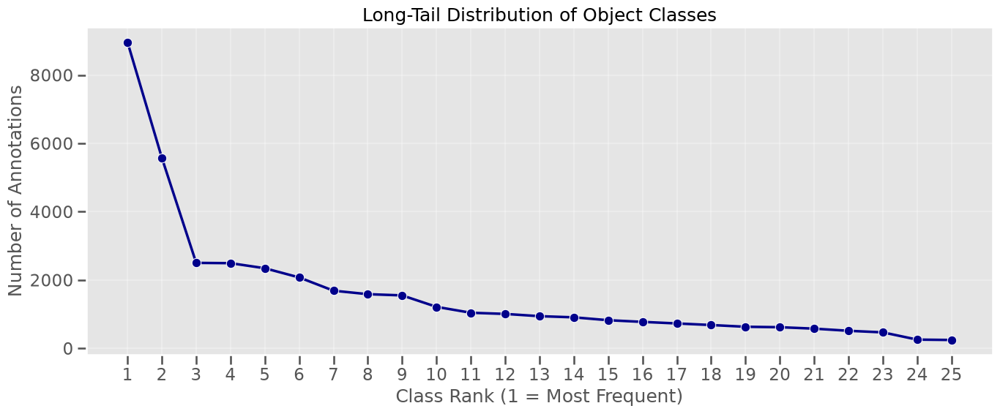

Long-Tail Distribution Interpretation:
- The analysis includes 25 object classes.
- Total class annotations: 40,195.
- The most frequent class is 'Person' with 8,962 annotations (22.30% of all annotations).
- The least frequent class is 'Bicycle Rack' with 244 annotations.
- The three most frequent classes account for 17,041 annotations (42.40% of all annotations).
- The most frequent class appears approximately 36.7 times more often than the least frequent class.
- The steep decline in the curve confirms a long-tail distribution. Models may therefore require class balancing, targeted augmentation, or weighted training to improve performance on rare classes.


In [7]:
# -------------------------------------------------------------------
# Long-tail analysis: inspect how annotation frequency is distributed
# across the 25 individual object classes.
#
# The goal is to confirm whether the dataset follows a long-tail pattern:
# a few dominant classes appear very often, while many rare classes
# have relatively few annotations. This is common in real-world urban
# scenes and affects detector training.
# -------------------------------------------------------------------

# Exclude the aggregate TOTAL row so the analysis reflects only
# true object categories and not the dataset-level summary.
#
# class_df includes a final row where class_id is NaN and class_name == "TOTAL".
# That row is useful for overall counts, but it would distort class-level
# frequency statistics and any rank-based long-tail visualization.
long_tail_df = (
    class_df[class_df["class_id"].notna()]   # keep only rows with a valid class_id
    .sort_values("total", ascending=False)  # highest-frequency classes first
    .reset_index(drop=True)                 # reset index to make class ranks obvious
    .copy()
)

# Compute each class's share of all annotations.
# This helps quantify the skew: a few classes can dominate the dataset.
total_class_annotations = long_tail_df["total"].sum()
long_tail_df["pct"] = (
    long_tail_df["total"] / total_class_annotations * 100
)

# -------------------------------------------------------------------
# Visualize the class-frequency curve
#
# This is a classic long-tail plot:
# - x-axis: class rank (1 = most frequent class)
# - y-axis: number of annotations for that class
#
# A steep drop from the first few classes indicates strong imbalance.
# -------------------------------------------------------------------
plt.figure(figsize=(14, 6))

sns.lineplot(
    x=np.arange(1, len(long_tail_df) + 1),
    y=long_tail_df["total"],
    marker="o",
    linewidth=2.5,
    color="darkblue"
)

plt.title("Long-Tail Distribution of Object Classes")
plt.xlabel("Class Rank (1 = Most Frequent)")
plt.ylabel("Number of Annotations")
plt.xticks(np.arange(1, len(long_tail_df) + 1))
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------
# Summarize the data distribution using key metrics.
#
# We extract:
# - the most frequent class
# - the rarest class
# - the combined contribution of the top 3 classes
# - the ratio between the most common and least common class
# -------------------------------------------------------------------
top_class_name = long_tail_df.iloc[0]["class_name"]
top_class_count = int(long_tail_df.iloc[0]["total"])

bottom_class_name = long_tail_df.iloc[-1]["class_name"]
bottom_class_count = int(long_tail_df.iloc[-1]["total"])

top_three_count = int(long_tail_df.head(3)["total"].sum())
top_three_percentage = top_three_count / total_class_annotations * 100

# -------------------------------------------------------------------
# Print an interpretation of the long-tail distribution.
#
# The narrative below explains why this chart matters in real detection
# problems: if training is not adjusted for imbalance, the model may
# over-focus on common classes and underperform on rare but important
# categories like hazards or obstacles.
# -------------------------------------------------------------------
print("Long-Tail Distribution Interpretation:")
print(f"- The analysis includes {len(long_tail_df)} object classes.")
print(f"- Total class annotations: {total_class_annotations:,}.")
print(
    f"- The most frequent class is '{top_class_name}' "
    f"with {top_class_count:,} annotations "
    f"({long_tail_df.iloc[0]['pct']:.2f}% of all annotations)."
)
print(
    f"- The least frequent class is '{bottom_class_name}' "
    f"with {bottom_class_count:,} annotations."
)
print(
    f"- The three most frequent classes account for "
    f"{top_three_count:,} annotations "
    f"({top_three_percentage:.2f}% of all annotations)."
)
print(
    f"- The most frequent class appears approximately "
    f"{top_class_count / bottom_class_count:.1f} times more often "
    f"than the least frequent class."
)
print(
    "- The steep decline in the curve confirms a long-tail distribution. "
    "Models may therefore require class balancing, targeted augmentation, "
    "or weighted training to improve performance on rare classes."
)


### Observations

- The frequency curve drops rapidly after the dominant classes, confirming a long-tail distribution.
- A small number of categories account for a large proportion of all annotations.
- Models trained without imbalance mitigation may favor frequent classes at the expense of rare obstacle categories.



# Image Level Statistics


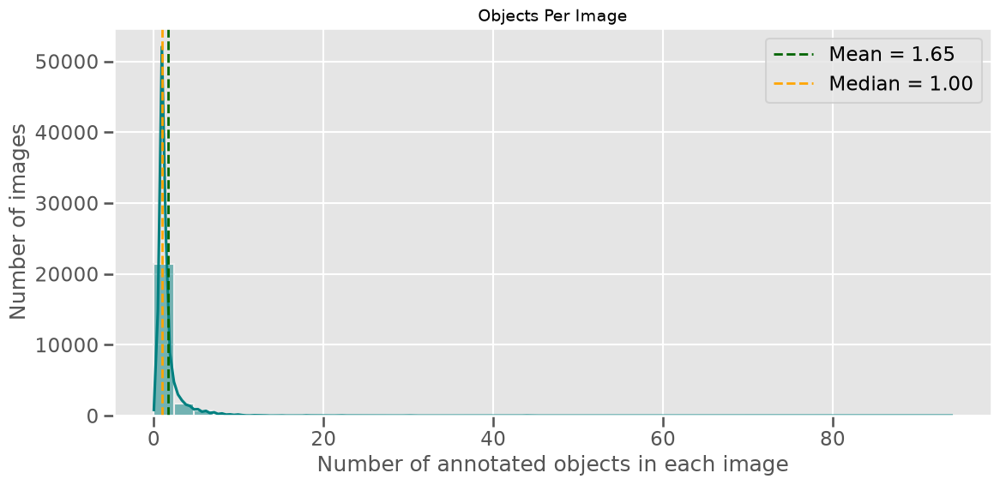

Objects-per-image interpretation:
- The dataset contains 24,326 images.
- Average number of objects per image: 1.65
- Median number of objects per image: 1.00
- Most images contain around 1 object(s).
- The maximum number of objects in a single image is 94.
- The 95th percentile is 4.00 objects per image.
- 831 images (3.4%) contain more than 5 annotated objects, indicating cluttered urban scenes.
- The distribution is not uniform: some images are sparse, while others contain many objects at once. This diversity is realistic for urban environments and increases the difficulty of object detection.


In [8]:
# Image complexity analysis:
# Count how many annotated objects are present in each image.
# The manifest was loaded earlier and already contains this information.
obj_counts = manifest_df["num_objects"]

# Calculate descriptive statistics for the object-count distribution.
# These values summarize typical, dense, and extreme scenes.
mean_objects = obj_counts.mean()
median_objects = obj_counts.median()
max_objects = obj_counts.max()
p95_objects = obj_counts.quantile(0.95)
mode_objects = obj_counts.mode().iloc[0]

# Create a histogram showing how frequently each object count occurs.
# KDE adds a smoothed approximation of the distribution.
plt.figure(figsize=(12, 6))
ax = sns.histplot(
    obj_counts,
    bins=40,
    kde=True,
    color="teal"
)

# Add vertical reference lines for the mean and median.
# The legend identifies the corresponding statistic for each line.
ax.axvline(
    mean_objects,
    color="darkgreen",
    linestyle="--",
    linewidth=2,
    label=f"Mean = {mean_objects:.2f}"
)

ax.axvline(
    median_objects,
    color="orange",
    linestyle="--",
    linewidth=2,
    label=f"Median = {median_objects:.2f}"
)

# Display the labels for the reference lines.
ax.legend()

# Add descriptive chart text.
plt.title("Objects Per Image", fontsize=14)
plt.xlabel("Number of annotated objects in each image")
plt.ylabel("Number of images")

# Prevent labels and titles from being clipped.
plt.tight_layout()
plt.show()

# Identify dense scenes containing more than five annotated objects.
# This provides a simple measure of scene clutter.
dense_images = (obj_counts > 5).sum()
dense_percent = dense_images / len(obj_counts) * 100

# Print a readable interpretation of the distribution.
print("Objects-per-image interpretation:")
print(f"- The dataset contains {len(obj_counts):,} images.")
print(f"- Average number of objects per image: {mean_objects:.2f}")
print(f"- Median number of objects per image: {median_objects:.2f}")
print(f"- Most images contain around {mode_objects} object(s).")
print(f"- The maximum number of objects in a single image is {max_objects}.")
print(f"- The 95th percentile is {p95_objects:.2f} objects per image.")
print(
    f"- {dense_images:,} images ({dense_percent:.1f}%) contain more than "
    "5 annotated objects, indicating cluttered urban scenes."
)
print(
    "- The distribution is not uniform: some images are sparse, while others "
    "contain many objects at once. This diversity is realistic for urban "
    "environments and increases the difficulty of object detection."
)


### Observations

- Images contain varying numbers of objects, indicating a mixture of simple and highly cluttered scenes.
- This diversity is valuable because it exposes models to both isolated obstacles and dense urban environments.
- Scene complexity is an important characteristic for assistive-vision applications where multiple hazards may appear simultaneously.



# Parse YOLO Labels


In [9]:
from tqdm import tqdm

# -------------------------------------------------------------------
# Parse YOLO annotation files and convert them into a structured DataFrame.
#
# This step is crucial for downstream EDA (Exploratory Data Analysis) because
# it turns raw text labelsinto tabular data that can be filtered, aggregated,
# and visualized.
# -------------------------------------------------------------------

# Store all valid bounding boxes from all splits in a single list.
# Each record is:
# [split, class_id, x_center, y_center, width, height, area]
records = []

# Track how many .txt label files were read in each split.
label_files_count = {"train": 0, "valid": 0, "test": 0}

# Count labels that do not conform to the expected YOLO box format.
# These are typically malformed lines or alternate annotation formats
# (for example polygon annotations or empty rows).
skipped_lines = 0

# Count the number of valid bounding-box annotations successfully parsed.
parsed_boxes = 0

for split in ["train", "valid", "test"]:
    # Path to the label directory for the current split.
    label_dir = os.path.join(DATASET_ROOT, split, "labels")

    # tqdm shows a real-time progress bar while scanning all label files.
    # This makes large datasets easier to debug and more user-friendly.
    for file in tqdm(os.listdir(label_dir), desc=f"Parsing {split} labels"):
        path = os.path.join(label_dir, file)
        label_files_count[split] += 1

        # Read the annotation file line by line.
        with open(path, "r", encoding="utf-8") as f:
            lines = f.readlines()

        # Each line in a YOLO label file represents one object annotation.
        # Example:
        # "2 0.5945 0.5094 0.5367 0.1226"
        for line in lines:
            vals = line.strip().split()

            # YOLO bounding-box annotations use the following schema:
            # <class_id> <x_center> <y_center> <width> <height>
            #
            # Values are normalized relative to the image dimensions.
            # We retain only valid entries with exactly 5 values after splitting.
            if len(vals) == 5:
                cls, x, y, w, h = map(float, vals)

                # Store the normalized box dimensions and also compute
                # the normalized area for size-based analysis.
                records.append([split, cls, x, y, w, h, w * h])
                parsed_boxes += 1
            else:
                # Lines with invalid format are ignored.
                # This can include empty lines, segmentation labels,
                # or other annotation types not supported here.
                skipped_lines += 1

# -------------------------------------------------------------------
# Convert the parsed records into a DataFrame for easier analysis.
# -------------------------------------------------------------------
bbox_df = pd.DataFrame(
    records,
    columns=["split", "class_id", "x", "y", "w", "h", "area"]
)

# -------------------------------------------------------------------
# Human-friendly summary of the generated dataframe
# -------------------------------------------------------------------
print("YOLO label parsing completed.")
print(f"Scanned {sum(label_files_count.values()):,} label files across splits.")
print(f"Successfully parsed {parsed_boxes:,} bounding boxes.")
print(f"Skipped {skipped_lines:,} non-standard annotation lines.")
print("")

# Inspect the DataFrame structure to verify the schema is correct.
print("DataFrame columns:")
print(bbox_df.columns.tolist())
print("")

# Show the first few rows so the format can be visually checked.
print("Preview of the parsed bbox dataframe:")
display(bbox_df.head())

# Count how many boxes belong to each split.
split_counts = (
    bbox_df["split"]
    .value_counts()
    .reindex(["train", "valid", "test"], fill_value=0)
)

print("")
print("Bounding boxes by split:")
print(split_counts.to_string())

# A quick class distribution summary across all parsed boxes.
# This helps verify that the labels match the expected class IDs.
class_counts = bbox_df["class_id"].value_counts().sort_index()
print("")
print("Top class frequencies in the parsed boxes:")
print(class_counts.head(10).to_string())

print("")
print("Interpretation:")
print("- Each row represents one annotated object bounding box from a YOLO label file.")
print("- The 'split' column indicates whether the box belongs to train, valid, or test.")
print("- The 'class_id' column is the object class index from the dataset config.")
print("- The 'x', 'y', 'w', and 'h' values are normalized center coordinates and box dimensions.")
print("- The 'area' column is the normalized box area, useful for object-size analysis.")


Parsing test labels: 100%|██████████| 1629/1629 [00:00<00:00, 15547.57it/s]


YOLO label parsing completed.
Scanned 24,326 label files across splits.
Successfully parsed 35,057 bounding boxes.
Skipped 5,138 non-standard annotation lines.

DataFrame columns:
['split', 'class_id', 'x', 'y', 'w', 'h', 'area']

Preview of the parsed bbox dataframe:


,split,class_id,x,y,w,h,area
0,train,17.0,0.362500,0.372656,0.601562,0.644531,0.387726
1,train,21.0,0.466406,0.791406,0.454688,0.392188,0.178323
2,train,3.0,0.521875,0.597656,0.198437,0.804688,0.159680
3,train,3.0,0.825781,0.696875,0.157812,0.606250,0.095674
4,train,22.0,0.399414,0.371094,0.742188,0.671875,0.498657



Bounding boxes by split:
split
train    28336
valid     4764
test      1957

Top class frequencies in the parsed boxes:
class_id
0.0     355
1.0     396
2.0    5578
3.0    8957
4.0    1618
5.0     907
6.0     342
7.0     471
8.0    1007
9.0    1549

Interpretation:
- Each row represents one annotated object bounding box from a YOLO label file.
- The 'split' column indicates whether the box belongs to train, valid, or test.
- The 'class_id' column is the object class index from the dataset config.
- The 'x', 'y', 'w', and 'h' values are normalized center coordinates and box dimensions.
- The 'area' column is the normalized box area, useful for object-size analysis.



# Spatial Distribution of Objects


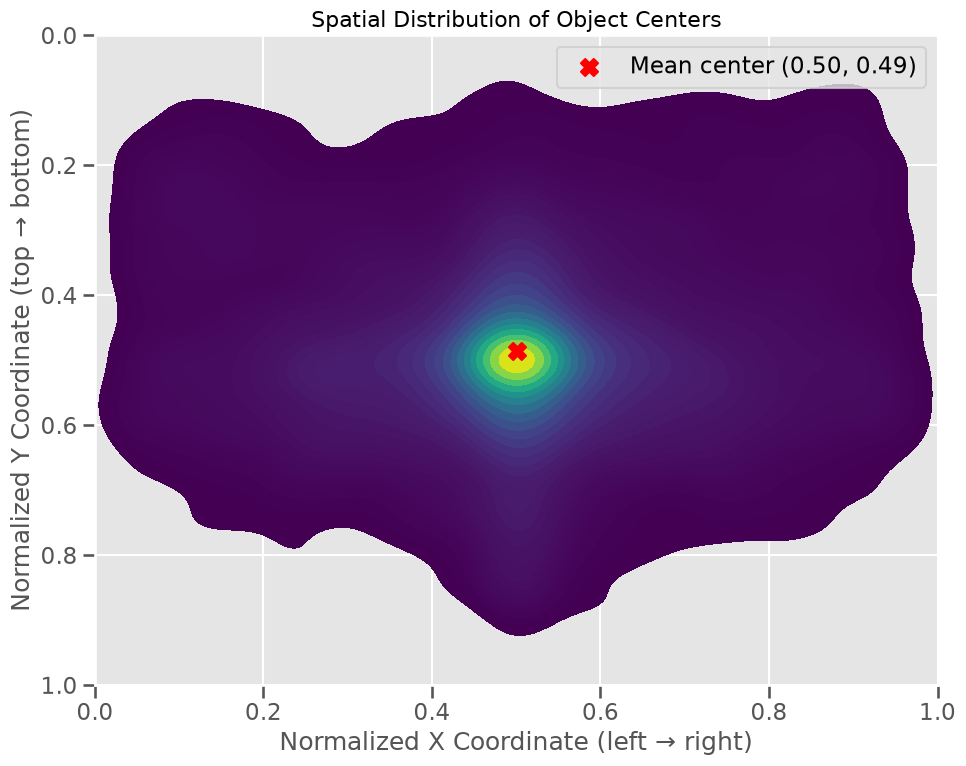

Spatial Distribution Interpretation:
- The plot summarizes 35,057 annotated object centers.
- The average object center is (0.501, 0.486), indicating the typical obstacle location in the image.
- The median object center is (0.500, 0.499), which is less affected by extreme positions.
- 47.1% of objects are located in the lower half of the image.
- 70.0% of objects fall within the central 50% of the image.
- Brighter regions indicate where object centers are more concentrated; darker regions indicate fewer annotations.
- A concentration toward the lower image area is expected because nearby obstacles and road-level objects commonly appear there.
- This spatial pattern is useful for understanding likely camera framing biases and for debugging model failure cases in edge or occluded regions.


In [10]:
# Spatial distribution of object centers.
# YOLO coordinates are normalized to the image size:
#   x ∈ [0, 1] from left to right
#   y ∈ [0, 1] from top to bottom
# This means:
#   - values near 0 are at the image edge
#   - values near 1 are near the opposite edge
#   - larger y values indicate positions lower in the image
#
# We use the parsed YOLO bounding boxes from bbox_df, which contains:
#   split, class_id, x, y, w, h, area
# where x and y are the normalized center coordinates of each object.

# -------------------------------------------------------------------
# 1) Compute summary statistics for object-center locations
# -------------------------------------------------------------------
# These values describe the "typical" placement of objects in the image.
x_center = bbox_df["x"].mean()
y_center = bbox_df["y"].mean()

x_median = bbox_df["x"].median()
y_median = bbox_df["y"].median()

# Percentage of objects whose center falls in the lower half of the image.
# This helps reveal whether objects are commonly placed near the ground or
# horizon in the urban scene.
lower_region_percent = (bbox_df["y"] > 0.5).mean() * 100

# Percentage of objects whose center falls in the central 50% of the image
# in both horizontal and vertical directions.
# This gives a simple view of whether objects are concentrated in the middle
# of the frame or spread out across the full image.
center_region_percent = (
    bbox_df["x"].between(0.25, 0.75)
    & bbox_df["y"].between(0.25, 0.75)
).mean() * 100

# -------------------------------------------------------------------
# 2) Visualize the spatial density of object centers
# -------------------------------------------------------------------
# A 2D density plot (kernel density estimate) shows where centers are most
# concentrated. Brighter/denser regions indicate that many object centers
# occur there.
plt.figure(figsize=(10, 8))

sns.kdeplot(
    data=bbox_df,
    x="x",
    y="y",
    fill=True,
    cmap="viridis",
    thresh=0.05,
    levels=30
)

# Mark the average center of all objects with a red "X".
# This helps visually compare the density hotspot with the mean location.
plt.scatter(
    x_center,
    y_center,
    color="red",
    marker="X",
    s=150,
    label=f"Mean center ({x_center:.2f}, {y_center:.2f})"
)

# Keep the coordinate system consistent with image space:
#   origin is top-left, so y increases downward.
plt.xlim(0, 1)
plt.ylim(1, 0)

# Add plot labels and title for interpretation.
plt.title("Spatial Distribution of Object Centers", fontsize=16)
plt.xlabel("Normalized X Coordinate (left → right)")
plt.ylabel("Normalized Y Coordinate (top → bottom)")
plt.legend()
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------
# 3) Print a human-readable interpretation of the spatial analysis
# -------------------------------------------------------------------
print("Spatial Distribution Interpretation:")
print(f"- The plot summarizes {len(bbox_df):,} annotated object centers.")
print(
    f"- The average object center is ({x_center:.3f}, {y_center:.3f}), "
    "indicating the typical obstacle location in the image."
)
print(
    f"- The median object center is ({x_median:.3f}, {y_median:.3f}), "
    "which is less affected by extreme positions."
)
print(
    f"- {lower_region_percent:.1f}% of objects are located in the lower "
    "half of the image."
)
print(
    f"- {center_region_percent:.1f}% of objects fall within the central "
    "50% of the image."
)
print(
    "- Brighter regions indicate where object centers are more concentrated; "
    "darker regions indicate fewer annotations."
)
print(
    "- A concentration toward the lower image area is expected because "
    "nearby obstacles and road-level objects commonly appear there."
)
print(
    "- This spatial pattern is useful for understanding likely camera framing "
    "biases and for debugging model failure cases in edge or occluded regions."
)



### Observations

- Object locations are not uniformly distributed across images.
- The highest density regions indicate where obstacles most commonly appear relative to the camera viewpoint.
- Such positional biases are expected in pedestrian-centric imagery where roads, sidewalks, vehicles, and street furniture frequently occupy predictable regions of the frame.
- Understanding spatial concentration can help explain detector behavior and localization performance.



# Bounding Box Analytics


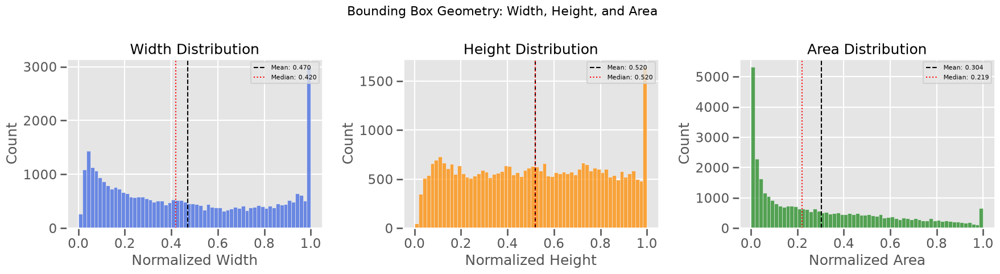

Bounding-box size interpretation:
- Each histogram shows how often objects appear at different relative sizes.
- Width and height vary across the dataset, indicating objects appear at different distances and scales.
- Mean normalized width: 0.470 | Median: 0.420
- Mean normalized height: 0.520 | Median: 0.520
- Mean normalized area: 0.304 | Median: 0.219
- 95th percentile width: 0.998
- 95th percentile height: 0.980
- 95th percentile area: 0.879
- The variation indicates that the dataset contains both small, distant objects and large foreground obstacles.
- This scale variation is important for model design, anchor selection, and choosing a suitable input resolution.
- A detector trained on this data should be robust to both tiny and large objects in realistic urban scenes.


In [11]:
# Bounding-box geometry analysis
# --------------------------------
# YOLO bounding-box dimensions are normalized between 0 and 1:
# - w: box width relative to the image width
# - h: box height relative to the image height
# - area: normalized bounding-box area, calculated as w * h
#
# Normalized values allow comparisons across images with different resolutions.
# Small values usually represent distant or small objects, while larger values
# generally represent nearby or larger objects.

# Create one row containing three plots:
# 1. Width distribution
# 2. Height distribution
# 3. Area distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# -------------------------------------------------------------------
# Width distribution
# -------------------------------------------------------------------
# Display how frequently different normalized bounding-box widths occur.
sns.histplot(
    bbox_df["w"],
    bins=60,
    ax=axes[0],
    color="royalblue"
)

# Add a dashed line showing the average bounding-box width.
width_mean = bbox_df["w"].mean()
axes[0].axvline(
    width_mean,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Mean: {width_mean:.3f}"
)

# Add a dotted line showing the median bounding-box width.
# The median is less affected by unusually large or small boxes.
width_median = bbox_df["w"].median()
axes[0].axvline(
    width_median,
    color="red",
    linestyle=":",
    linewidth=1.5,
    label=f"Median: {width_median:.3f}"
)

axes[0].set_title("Width Distribution")
axes[0].set_xlabel("Normalized Width")
axes[0].set_ylabel("Count")
axes[0].legend(loc="upper right", fontsize=8)

# -------------------------------------------------------------------
# Height distribution
# -------------------------------------------------------------------
# Display how frequently different normalized bounding-box heights occur.
sns.histplot(
    bbox_df["h"],
    bins=60,
    ax=axes[1],
    color="darkorange"
)

# Mark the mean normalized height.
height_mean = bbox_df["h"].mean()
axes[1].axvline(
    height_mean,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Mean: {height_mean:.3f}"
)

# Mark the median normalized height.
height_median = bbox_df["h"].median()
axes[1].axvline(
    height_median,
    color="red",
    linestyle=":",
    linewidth=1.5,
    label=f"Median: {height_median:.3f}"
)

axes[1].set_title("Height Distribution")
axes[1].set_xlabel("Normalized Height")
axes[1].set_ylabel("Count")
axes[1].legend(loc="upper right", fontsize=8)

# -------------------------------------------------------------------
# Area distribution
# -------------------------------------------------------------------
# The area indicates the fraction of the image covered by each box.
# Smaller areas commonly correspond to distant or small objects.
sns.histplot(
    bbox_df["area"],
    bins=60,
    ax=axes[2],
    color="forestgreen"
)

# Mark the mean normalized bounding-box area.
area_mean = bbox_df["area"].mean()
axes[2].axvline(
    area_mean,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Mean: {area_mean:.3f}"
)

# Mark the median normalized bounding-box area.
area_median = bbox_df["area"].median()
axes[2].axvline(
    area_median,
    color="red",
    linestyle=":",
    linewidth=1.5,
    label=f"Median: {area_median:.3f}"
)

axes[2].set_title("Area Distribution")
axes[2].set_xlabel("Normalized Area")
axes[2].set_ylabel("Count")
axes[2].legend(loc="upper right", fontsize=8)

# Add a shared title for the complete figure.
plt.suptitle(
    "Bounding Box Geometry: Width, Height, and Area",
    fontsize=16
)

# Adjust spacing so titles and labels do not overlap.
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------
# Compute high-percentile values
# -------------------------------------------------------------------
# The 95th percentile indicates the value below which 95% of boxes fall.
# It helps describe the upper end of the typical size range without being
# overly influenced by the single largest bounding boxes.
width_p95 = bbox_df["w"].quantile(0.95)
height_p95 = bbox_df["h"].quantile(0.95)
area_p95 = bbox_df["area"].quantile(0.95)

# -------------------------------------------------------------------
# Print a human-readable interpretation
# -------------------------------------------------------------------
print("Bounding-box size interpretation:")
print(
    "- Each histogram shows how often objects appear at different "
    "relative sizes."
)
print(
    "- Width and height vary across the dataset, indicating objects appear "
    "at different distances and scales."
)
print(
    f"- Mean normalized width: {width_mean:.3f} | "
    f"Median: {width_median:.3f}"
)
print(
    f"- Mean normalized height: {height_mean:.3f} | "
    f"Median: {height_median:.3f}"
)
print(
    f"- Mean normalized area: {area_mean:.3f} | "
    f"Median: {area_median:.3f}"
)
print(f"- 95th percentile width: {width_p95:.3f}")
print(f"- 95th percentile height: {height_p95:.3f}")
print(f"- 95th percentile area: {area_p95:.3f}")
print(
    "- The variation indicates that the dataset contains both small, "
    "distant objects and large foreground obstacles."
)
print(
    "- This scale variation is important for model design, anchor selection, "
    "and choosing a suitable input resolution."
)
print(
    "- A detector trained on this data should be robust to both tiny and "
    "large objects in realistic urban scenes."
)


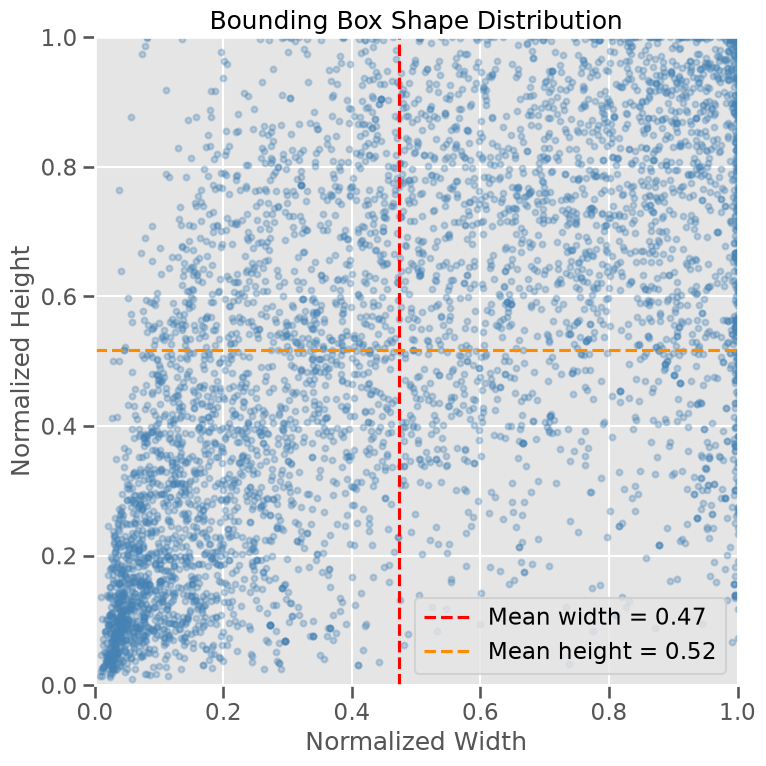

Bounding-box shape interpretation:
- The plot shows 5,000 randomly sampled bounding boxes.
- Average normalized width: 0.474
- Average normalized height: 0.518
- Average width-to-height ratio: 1.05
- 7.9% of boxes are wide horizontally (ratio > 2).
- 25.0% of boxes are tall vertically (ratio < 0.5).
- Points near the bottom-left represent small objects, while points toward the top-right represent large objects.
- A broad spread indicates substantial variation in object shape and scale, which increases the localization challenge for detection models.


In [12]:
# Randomly sample bounding boxes to keep the visualization readable.
# Sampling does not modify the original bbox_df DataFrame.
sample = bbox_df.sample(
    min(5000, len(bbox_df)),
    random_state=42
).copy()

# Calculate each bounding box's width-to-height ratio.
# Replace zero heights with NaN to avoid division-by-zero errors.
sample["aspect_ratio"] = sample["w"] / sample["h"].replace(0, np.nan)

# Calculate the average normalized width and height.
# Normalized values range from 0 to 1 relative to the image dimensions.
width_mean = sample["w"].mean()
height_mean = sample["h"].mean()

# Calculate the average width-to-height ratio.
# Ratios above 1 indicate wider boxes; ratios below 1 indicate taller boxes.
aspect_mean = sample["aspect_ratio"].mean()

# Calculate the percentage of horizontally wide boxes.
# A ratio greater than 2 means the width is more than twice the height.
wide_boxes = (sample["aspect_ratio"] > 2).mean() * 100

# Calculate the percentage of vertically tall boxes.
# A ratio below 0.5 means the height is more than twice the width.
tall_boxes = (sample["aspect_ratio"] < 0.5).mean() * 100

# Create a square figure because both axes use the same normalized scale.
plt.figure(figsize=(8, 8))

# Plot bounding-box width against bounding-box height.
# Each point represents one sampled object annotation.
plt.scatter(
    sample["w"],
    sample["h"],
    alpha=0.3,       # Transparency helps reveal dense regions
    s=18,            # Marker size
    color="steelblue"
)

# Add a vertical reference line for the average box width.
plt.axvline(
    width_mean,
    color="red",
    linestyle="--",
    label=f"Mean width = {width_mean:.2f}"
)

# Add a horizontal reference line for the average box height.
plt.axhline(
    height_mean,
    color="darkorange",
    linestyle="--",
    label=f"Mean height = {height_mean:.2f}"
)

# Add descriptive labels and a title.
plt.title("Bounding Box Shape Distribution")
plt.xlabel("Normalized Width")
plt.ylabel("Normalized Height")

# Keep both axes within the valid normalized-coordinate range.
plt.xlim(0, 1)
plt.ylim(0, 1)

# Display the reference-line labels.
plt.legend()

# Adjust spacing to prevent labels from being clipped.
plt.tight_layout()
plt.show()

# Print a readable summary of the plotted bounding-box shapes.
print("Bounding-box shape interpretation:")
print(f"- The plot shows {len(sample):,} randomly sampled bounding boxes.")
print(f"- Average normalized width: {width_mean:.3f}")
print(f"- Average normalized height: {height_mean:.3f}")
print(f"- Average width-to-height ratio: {aspect_mean:.2f}")
print(f"- {wide_boxes:.1f}% of boxes are wide horizontally (ratio > 2).")
print(f"- {tall_boxes:.1f}% of boxes are tall vertically (ratio < 0.5).")

# Explain how to interpret point locations in the scatter plot.
print(
    "- Points near the bottom-left represent small objects, while points "
    "toward the top-right represent large objects."
)
print(
    "- A broad spread indicates substantial variation in object shape and scale, "
    "which increases the localization challenge for detection models."
)


### Observations

- Bounding box widths and heights span a wide range of normalized scales, indicating substantial object-size diversity across the dataset.
- The mean normalized width is approximately 0.469 and the median is 0.420, while the mean normalized height is about 0.518 and the median is 0.520, showing a mix of compact and large objects.
- Normalized box area varies significantly, with a mean of 0.304 and a median of 0.219; the 95th-percentile area reaches 0.879, indicating that some obstacles occupy a large fraction of the image.
- This broad distribution reflects realistic urban conditions, where distant obstacles, pedestrians, vehicles, and nearby foreground barriers coexist in the same scenes.
- Such scale variation should be considered when selecting model architectures, input resolutions, and anchor strategies to maintain robust performance across both small and large objects.



# Visualize Random Samples with Bounding Boxes


DATASET SAMPLE VISUALIZATION
Split selected       : train
Image directory      : dataset/train/images
Label directory      : dataset/train/labels
Available images     : 19,186
Images being shown   : 18

How to interpret the visualization:
  • Rectangles show YOLO bounding-box annotations.
  • Polygons show YOLO segmentation annotations.
  • Colors identify object classes.
  • Labels show the class name.
  • Titles report valid annotations for each image.


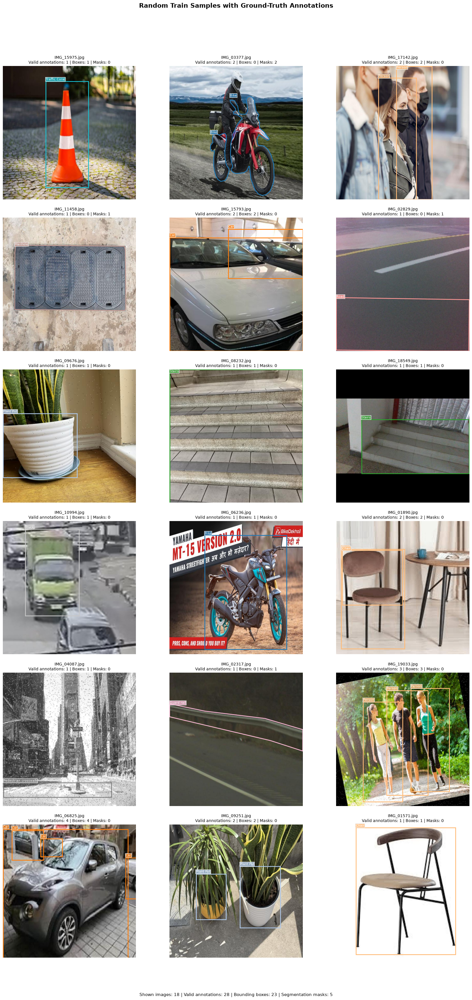


VISUALIZATION SUMMARY
Images displayed              : 18
Valid annotations displayed   : 28
Bounding-box annotations      : 23
Segmentation-mask annotations : 5
Ignored invalid label lines   : 0
Images without label files    : 0

Annotation format explanation:
  • 5 values per line:
    class_id, x_center, y_center, width, height
    → YOLO bounding box
  • More than 5 values per line:
    class_id followed by normalized polygon coordinates
    → YOLO segmentation annotation


In [13]:
import matplotlib.patches as patches

# Use the class names from the dataset YAML configuration.
NAMES = data_yaml["names"]


def show_random_samples(split="train", n=9):
    """
    Display random dataset images with YOLO annotations.

    YOLO annotations can be either:
    - Bounding boxes:
      class_id, x_center, y_center, width, height
    - Segmentation polygons:
      class_id, x1, y1, x2, y2, ...

    Coordinates are normalized between 0 and 1.
    """

    # Build paths to the selected split's images and labels.
    image_dir = os.path.join(DATASET_ROOT, split, "images")
    label_dir = os.path.join(DATASET_ROOT, split, "labels")

    # Select only supported image files.
    image_files = [
        f
        for f in os.listdir(image_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]

    # Stop if the selected split contains no images.
    if not image_files:
        print(f"No images found in: {image_dir}")
        return

    # Do not request more images than are available.
    n = min(n, len(image_files))

    # Randomly select images for visualization.
    files = random.sample(image_files, n)

    # Arrange the images in three columns.
    rows = int(np.ceil(n / 3))

    fig, axes = plt.subplots(
        rows,
        3,
        figsize=(18, rows * 6),
        squeeze=False
    )
    axes = axes.flatten()

    # Assign one consistent color to each class.
    colors = sns.color_palette("tab20", len(NAMES))

    # Dataset-level counters for the final summary.
    total_annotations = 0
    total_boxes = 0
    total_masks = 0
    total_invalid_lines = 0
    images_without_labels = 0

    print("=" * 70)
    print("DATASET SAMPLE VISUALIZATION")
    print("=" * 70)
    print(f"Split selected       : {split}")
    print(f"Image directory      : {image_dir}")
    print(f"Label directory      : {label_dir}")
    print(f"Available images     : {len(image_files):,}")
    print(f"Images being shown   : {n}")
    print()
    print("How to interpret the visualization:")
    print("  • Rectangles show YOLO bounding-box annotations.")
    print("  • Polygons show YOLO segmentation annotations.")
    print("  • Colors identify object classes.")
    print("  • Labels show the class name.")
    print("  • Titles report valid annotations for each image.")
    print("=" * 70)

    # Process each selected image.
    for ax, file in zip(axes, files):
        img_path = os.path.join(image_dir, file)

        # Read the image with OpenCV.
        img = cv2.imread(img_path)

        # Handle images that cannot be loaded.
        if img is None:
            ax.set_title(f"{file}\nImage could not be loaded")
            ax.axis("off")
            continue

        # Convert OpenCV's BGR format to Matplotlib's RGB format.
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        height, width = img.shape[:2]

        # Label files have the same filename stem as their image.
        label_path = os.path.join(
            label_dir,
            os.path.splitext(file)[0] + ".txt"
        )

        # Display the image before drawing annotations on top of it.
        ax.imshow(img)

        # Counters for the current image.
        annotation_count = 0
        box_count = 0
        mask_count = 0
        invalid_lines = 0

        # Check whether a corresponding label file exists.
        if not os.path.exists(label_path):
            images_without_labels += 1
        else:
            # Read all annotation lines from the label file.
            with open(label_path, "r", encoding="utf-8") as f:
                lines = f.readlines()

            # Parse each YOLO annotation line.
            for line in lines:
                values = line.strip().split()

                # Every annotation needs at least a class ID and four values.
                if len(values) < 5:
                    invalid_lines += 1
                    continue

                try:
                    # Class IDs should be integer values.
                    cls = int(float(values[0]))

                    # Ignore class IDs that are outside the configured range.
                    if not 0 <= cls < len(NAMES):
                        invalid_lines += 1
                        continue

                    # Use the class-specific color and display name.
                    color = colors[cls]
                    class_name = NAMES[cls]

                    # Exactly five values represent a YOLO bounding box.
                    if len(values) == 5:
                        xc, yc, box_width, box_height = map(
                            float,
                            values[1:5]
                        )

                        # Convert normalized coordinates to pixel coordinates.
                        x1 = (xc - box_width / 2) * width
                        y1 = (yc - box_height / 2) * height
                        pixel_width = box_width * width
                        pixel_height = box_height * height

                        # Draw the bounding box.
                        rect = patches.Rectangle(
                            (x1, y1),
                            pixel_width,
                            pixel_height,
                            linewidth=2,
                            edgecolor=color,
                            facecolor="none"
                        )
                        ax.add_patch(rect)

                        # Add the class name near the top-left corner.
                        ax.text(
                            x1,
                            max(10, y1 - 5),
                            class_name,
                            color="white",
                            fontsize=8,
                            bbox=dict(
                                facecolor=color,
                                alpha=0.8,
                                pad=1
                            )
                        )

                        annotation_count += 1
                        box_count += 1

                    # More than five values represent a segmentation polygon.
                    else:
                        # Convert normalized polygon coordinates to an array.
                        coords = np.array(
                            list(map(float, values[1:])),
                            dtype=np.float32
                        )

                        # A polygon needs at least three points.
                        # Coordinates must occur in x/y pairs.
                        if len(coords) < 6 or len(coords) % 2 != 0:
                            invalid_lines += 1
                            continue

                        # Convert normalized polygon coordinates to pixels.
                        xs = coords[0::2] * width
                        ys = coords[1::2] * height

                        # Combine x and y coordinates into point pairs.
                        polygon_points = np.column_stack([xs, ys])

                        # Draw the segmentation polygon without filling it.
                        polygon = patches.Polygon(
                            polygon_points,
                            closed=True,
                            fill=False,
                            linewidth=2,
                            edgecolor=color
                        )
                        ax.add_patch(polygon)

                        # Add the class name near the polygon's upper-left area.
                        ax.text(
                            xs.min(),
                            ys.min(),
                            class_name,
                            color="white",
                            fontsize=8,
                            bbox=dict(
                                facecolor=color,
                                alpha=0.8,
                                pad=1
                            )
                        )

                        annotation_count += 1
                        mask_count += 1

                # Invalid numeric values or malformed annotation data are ignored.
                except (ValueError, IndexError):
                    invalid_lines += 1

        # Add the current image's counts to the overall totals.
        total_annotations += annotation_count
        total_boxes += box_count
        total_masks += mask_count
        total_invalid_lines += invalid_lines

        # Show annotation statistics in the subplot title.
        title = (
            f"{file}\n"
            f"Valid annotations: {annotation_count} | "
            f"Boxes: {box_count} | Masks: {mask_count}"
        )

        # Report invalid lines when any were found.
        if invalid_lines:
            title += f"\nIgnored invalid lines: {invalid_lines}"

        ax.set_title(title, fontsize=10)
        ax.axis("off")

    # Hide unused subplot axes when n is not a multiple of three.
    for ax in axes[len(files):]:
        ax.axis("off")

    # Add a figure-level title.
    fig.suptitle(
        f"Random {split.capitalize()} Samples with Ground-Truth Annotations",
        fontsize=16,
        fontweight="bold"
    )

    # Add an overall annotation summary below the figure.
    fig.text(
        0.5,
        0.01,
        (
            f"Shown images: {n} | "
            f"Valid annotations: {total_annotations} | "
            f"Bounding boxes: {total_boxes} | "
            f"Segmentation masks: {total_masks}"
        ),
        ha="center",
        fontsize=11
    )

    # Adjust layout so titles and the footer do not overlap.
    plt.tight_layout(rect=[0, 0.04, 1, 0.95])
    plt.show()

    # Print a detailed summary after displaying the samples.
    print("\n" + "=" * 70)
    print("VISUALIZATION SUMMARY")
    print("=" * 70)
    print(f"Images displayed              : {n}")
    print(f"Valid annotations displayed   : {total_annotations}")
    print(f"Bounding-box annotations      : {total_boxes}")
    print(f"Segmentation-mask annotations : {total_masks}")
    print(f"Ignored invalid label lines   : {total_invalid_lines}")
    print(f"Images without label files    : {images_without_labels}")
    print()
    print("Annotation format explanation:")
    print("  • 5 values per line:")
    print("    class_id, x_center, y_center, width, height")
    print("    → YOLO bounding box")
    print("  • More than 5 values per line:")
    print("    class_id followed by normalized polygon coordinates")
    print("    → YOLO segmentation annotation")
    print("=" * 70)


# Display 18 random training images.
show_random_samples("train", 18)

### Observations

- Random samples show substantial variation in lighting, camera perspective, background clutter, and urban object types.
- The annotations include both bounding boxes and segmentation polygons, covering diverse obstacles such as vehicles, pedestrians, road features, and street furniture.
- Most annotations align well with visible objects, although occasional malformed or non-standard label entries may require additional validation.
- This scene and annotation diversity supports the development of robust detectors for real-world urban and assistive-vision applications.



# Duplicate and Integrity Validation


In [14]:
# Validate image-label pairing for every dataset split.
# Each image must have exactly one label file with the same filename stem.
# Example:
#   dataset/train/images/IMG_00001.jpg
#   dataset/train/labels/IMG_00001.txt

# Supported image file extensions used when scanning image directories.
# `image_extensions` is already defined in the notebook, so it is reused here.

# Store one summary dictionary for each dataset split.
integrity_results = []

print("=" * 75)
print("DATASET IMAGE-LABEL INTEGRITY CHECK")
print("=" * 75)
print("Expected structure:")
print("  image file:  split/images/name.jpg")
print("  label file:  split/labels/name.txt")
print("")

# Check the training, validation, and test splits separately.
for split in ["train", "valid", "test"]:
    # Construct the image and label directory paths for the current split.
    image_dir = os.path.join(DATASET_ROOT, split, "images")
    label_dir = os.path.join(DATASET_ROOT, split, "labels")

    # Collect image filename stems.
    # The stem excludes both the directory and file extension.
    # For example, "IMG_00001.jpg" becomes "IMG_00001".
    image_extensions = (
        ".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"
    )

    image_files = {
        os.path.splitext(filename)[0]
        for filename in os.listdir(image_dir)
        if filename.lower().endswith(image_extensions)
    }

    # Collect label filename stems.
    # Label files are expected to use the `.txt` extension.
    label_files = {
        os.path.splitext(filename)[0]
        for filename in os.listdir(label_dir)
        if filename.lower().endswith(".txt")
    }

    # Images present in the image directory but missing a label file.
    missing_labels = sorted(image_files - label_files)

    # Label files present without a corresponding image.
    orphan_labels = sorted(label_files - image_files)

    # Filename stems that occur in both directories.
    matched_files = image_files & label_files

    # The split passes only when no files are unmatched.
    split_is_valid = not missing_labels and not orphan_labels

    # Save numerical results for the final summary table.
    integrity_results.append({
        "Split": split,
        "Images": len(image_files),
        "Labels": len(label_files),
        "Matched": len(matched_files),
        "Missing labels": len(missing_labels),
        "Orphan labels": len(orphan_labels),
        "Status": "PASS" if split_is_valid else "CHECK"
    })

    # Print a detailed report for the current split.
    print(f"{split.upper()} SPLIT")
    print("-" * 75)
    print(f"Image directory             : {image_dir}")
    print(f"Label directory             : {label_dir}")
    print(f"Images found                : {len(image_files):,}")
    print(f"Label files found           : {len(label_files):,}")
    print(f"Image-label pairs           : {len(matched_files):,}")
    print(f"Images without labels       : {len(missing_labels):,}")
    print(f"Labels without images       : {len(orphan_labels):,}")

    # Provide a human-readable status message.
    if split_is_valid:
        print("Integrity status            : PASS - all files are paired")
    else:
        print("Integrity status            : CHECK - unmatched files detected")

    # Display a few examples to help locate missing annotations.
    # Limiting the output prevents very large lists from being printed.
    if missing_labels:
        print("Example images missing labels:", missing_labels[:5])

    # Display a few examples of labels whose images are missing.
    if orphan_labels:
        print("Example orphan labels:", orphan_labels[:5])

    print("")

# Convert the list of split-level dictionaries into a DataFrame.
# This makes the results easier to read and analyze.
integrity_df = pd.DataFrame(integrity_results)

print("=" * 75)
print("OVERALL INTEGRITY SUMMARY")
print("=" * 75)

# Display the integrity results for all dataset splits.
display(integrity_df)

# Add missing-label counts across all splits.
total_missing = integrity_df["Missing labels"].sum()

# Add orphan-label counts across all splits.
total_orphan = integrity_df["Orphan labels"].sum()

# Report the final dataset-level conclusion.
if total_missing == 0 and total_orphan == 0:
    print(
        "Conclusion: PASS. Every supported image has a corresponding "
        "label file, and no orphan label files were found."
    )
else:
    print(
        f"Conclusion: CHECK REQUIRED. Found {total_missing:,} images "
        f"without labels and {total_orphan:,} orphan label files."
    )

# Explain why matching filenames are important for model training.
print(
    "Interpretation: Matching filename stems ensure that every image is "
    "paired with its correct annotations during training and evaluation."
)


DATASET IMAGE-LABEL INTEGRITY CHECK
Expected structure:
  image file:  split/images/name.jpg
  label file:  split/labels/name.txt

TRAIN SPLIT
---------------------------------------------------------------------------
Image directory             : dataset/train/images
Label directory             : dataset/train/labels
Images found                : 19,186
Label files found           : 19,186
Image-label pairs           : 19,186
Images without labels       : 0
Labels without images       : 0
Integrity status            : PASS - all files are paired

VALID SPLIT
---------------------------------------------------------------------------
Image directory             : dataset/valid/images
Label directory             : dataset/valid/labels
Images found                : 3,511
Label files found           : 3,511
Image-label pairs           : 3,511
Images without labels       : 0
Labels without images       : 0
Integrity status            : PASS - all files are paired

TEST SPLIT
-------------

,Split,Images,Labels,Matched,Missing labels,Orphan labels,Status
0,train,19186,19186,19186,0,0,PASS
1,valid,3511,3511,3511,0,0,PASS
2,test,1629,1629,1629,0,0,PASS


Conclusion: PASS. Every supported image has a corresponding label file, and no orphan label files were found.
Interpretation: Matching filename stems ensure that every image is paired with its correct annotations during training and evaluation.


### Observations

- All dataset splits passed the image-label integrity check.
- The dataset contains 19,186 training, 3,511 validation, and 1,629 test image-label pairs.
- No images were missing labels, and no orphan label files were detected.
- Matching filenames across each split confirm that the dataset is correctly packaged for model training and evaluation.


# Computer Vision Insights

This section evaluates illumination characteristics in a sample of 1,000 training images using mean grayscale intensity, where 0 represents black and 255 represents white.

- Mean brightness: **131.75 / 255**
- Median brightness: **126.62 / 255**
- Standard deviation: **39.80**
- Brightness range: **26.76–226.98**
- Central 90% of images: **74.50–203.25**

The broad distribution confirms varied lighting and exposure conditions. This diversity is useful for developing obstacle-detection models that remain robust across darker scenes, normal daytime conditions, and brightly illuminated environments.


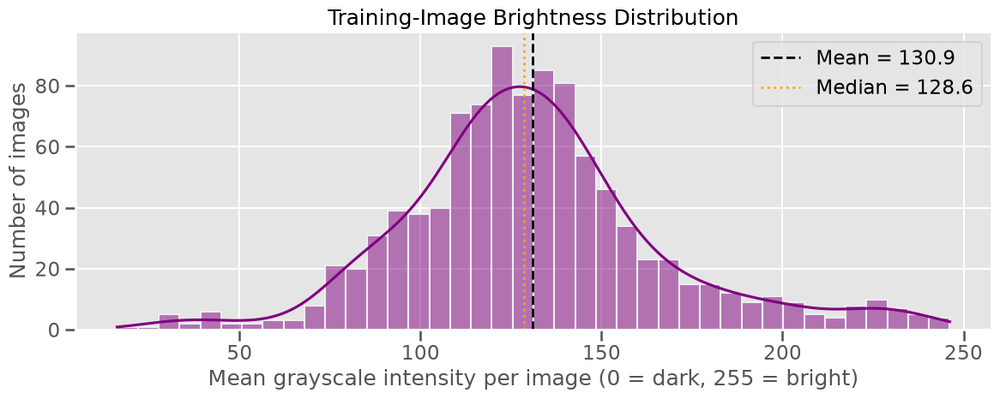

Brightness Analysis Interpretation:
- Images requested for analysis: 1,000
- Images successfully processed: 1,000
- Mean brightness: 130.92 / 255
- Median brightness: 128.64 / 255
- Brightness standard deviation: 36.04
- Darkest image mean: 16.14
- Brightest image mean: 246.19
- The central 90% of sampled images have mean brightness between 78.71 and 202.54.
- Lower values represent darker scenes, while higher values represent brighter scenes. A broad histogram indicates varied lighting or exposure conditions in the training data.


In [15]:

# Measure average grayscale intensity for up to 1,000 training images.
# Brightness values range from 0 (black) to 255 (white).
brightness = []

train_image_dir = f"{DATASET_ROOT}/train/images"
train_images = [
    filename
    for filename in os.listdir(train_image_dir)
    if filename.lower().endswith(image_extensions)
][:1000]

unreadable_images = 0

for img_name in train_images:
    img_path = os.path.join(train_image_dir, img_name)
    img = cv2.imread(img_path)

    if img is None:
        unreadable_images += 1
        continue

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    brightness.append(gray.mean())

brightness = np.array(brightness)

# Calculate descriptive brightness statistics.
brightness_mean = brightness.mean()
brightness_median = np.median(brightness)
brightness_std = brightness.std()
brightness_min = brightness.min()
brightness_max = brightness.max()
brightness_p05, brightness_p95 = np.percentile(brightness, [5, 95])

# Plot the distribution and reference lines for typical brightness values.
plt.figure(figsize=(12, 5))
ax = sns.histplot(brightness, bins=40, color="purple", kde=True)

ax.axvline(
    brightness_mean,
    color="black",
    linestyle="--",
    linewidth=2,
    label=f"Mean = {brightness_mean:.1f}"
)
ax.axvline(
    brightness_median,
    color="orange",
    linestyle=":",
    linewidth=2,
    label=f"Median = {brightness_median:.1f}"
)

plt.title("Training-Image Brightness Distribution")
plt.xlabel("Mean grayscale intensity per image (0 = dark, 255 = bright)")
plt.ylabel("Number of images")
plt.legend()
plt.tight_layout()
plt.show()

# Explain the result in readable terms.
print("Brightness Analysis Interpretation:")
print(f"- Images requested for analysis: {len(train_images):,}")
print(f"- Images successfully processed: {len(brightness):,}")

if unreadable_images:
    print(f"- Images skipped because they could not be read: {unreadable_images:,}")

print(f"- Mean brightness: {brightness_mean:.2f} / 255")
print(f"- Median brightness: {brightness_median:.2f} / 255")
print(f"- Brightness standard deviation: {brightness_std:.2f}")
print(f"- Darkest image mean: {brightness_min:.2f}")
print(f"- Brightest image mean: {brightness_max:.2f}")
print(
    f"- The central 90% of sampled images have mean brightness between "
    f"{brightness_p05:.2f} and {brightness_p95:.2f}."
)
print(
    "- Lower values represent darker scenes, while higher values represent "
    "brighter scenes. A broad histogram indicates varied lighting or exposure "
    "conditions in the training data."
)


### Observations

- Across 1,000 training images, mean brightness is **131.75 / 255** (median: **126.62**), indicating generally moderate illumination.
- Brightness varies substantially (standard deviation: **39.80**), ranging from **26.76** in the darkest sampled image to **226.98** in the brightest.
- The central 90% of images fall between **74.50** and **203.25**, confirming diverse lighting and exposure conditions.
- This variability supports evaluation of illumination robustness, which is important for real-world assistive-vision systems.


# Pretrained YOLO Exploration

In [16]:

!pip install -q ultralytics


Selected 20 test images for pretrained-model exploration.

[Image 1/20] IMG_19187.jpg | Inference: 5.1 ms
Detections above confidence threshold: 2
---------------------------------------------------------------------------
01. car             | class_id=2 | confidence=38.09% | pixel_box=[55, 46, 634, 600] | normalized_box=[0.087, 0.073, 0.992, 0.939] | area=0.7830 (large)
02. truck           | class_id=7 | confidence=33.31% | pixel_box=[60, 28, 633, 618] | normalized_box=[0.094, 0.044, 0.990, 0.966] | area=0.8255 (large)

Image summary:
- Total detections: 2
- Mean confidence: 35.70%
- Mean normalized area: 0.8042
- Most frequent detected class: car (1)


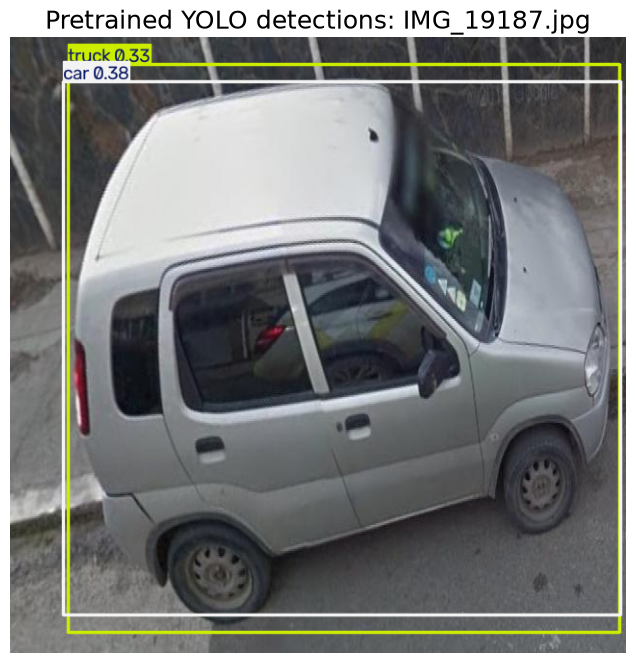


[Image 2/20] IMG_19188.jpg | Inference: 11.4 ms
Detections above confidence threshold: 0
---------------------------------------------------------------------------
No detections above conf=0.25.


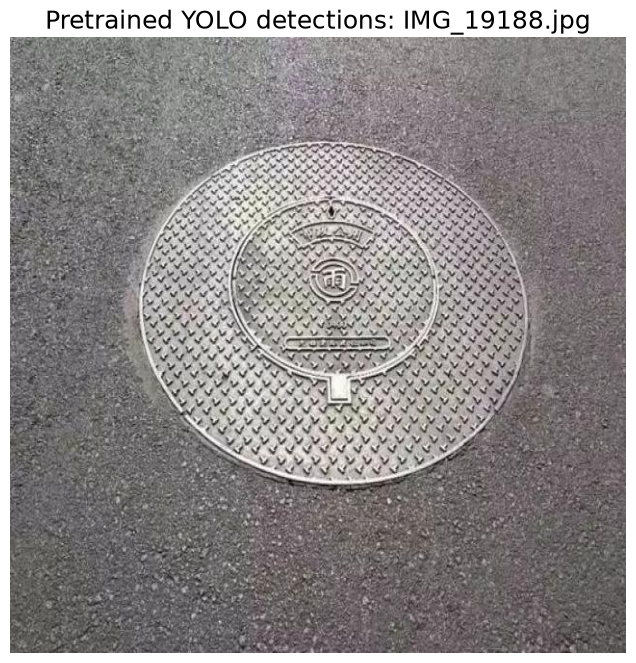


[Image 3/20] IMG_19189.jpg | Inference: 6.1 ms
Detections above confidence threshold: 2
---------------------------------------------------------------------------
01. truck           | class_id=7 | confidence=50.93% | pixel_box=[0, 0, 200, 63] | normalized_box=[0.001, 0.000, 0.314, 0.099] | area=0.0308 (medium) | near top edge
02. person          | class_id=0 | confidence=25.90% | pixel_box=[302, 320, 357, 387] | normalized_box=[0.473, 0.501, 0.558, 0.606] | area=0.0090 (small)

Image summary:
- Total detections: 2
- Mean confidence: 38.42%
- Mean normalized area: 0.0199
- Most frequent detected class: truck (1)


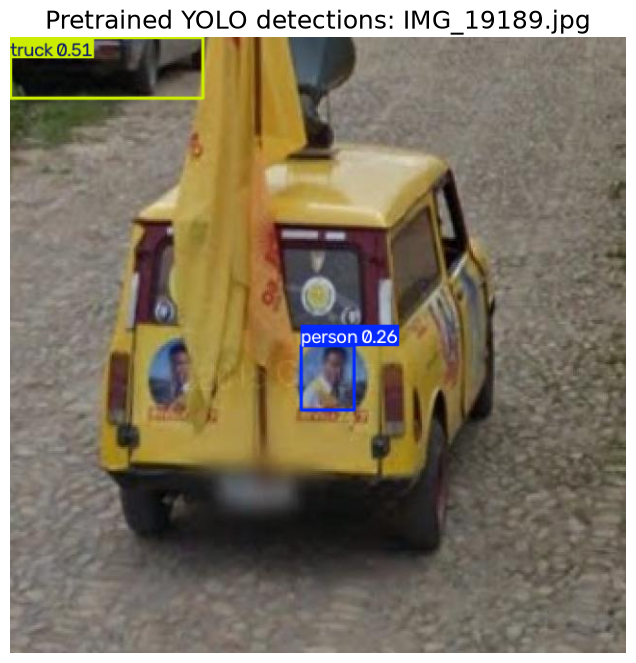


[Image 4/20] IMG_19190.jpg | Inference: 12.6 ms
Detections above confidence threshold: 1
---------------------------------------------------------------------------
01. truck           | class_id=7 | confidence=81.28% | pixel_box=[109, 87, 548, 584] | normalized_box=[0.170, 0.137, 0.857, 0.914] | area=0.5339 (large)

Image summary:
- Total detections: 1
- Mean confidence: 81.28%
- Mean normalized area: 0.5339
- Most frequent detected class: truck (1)


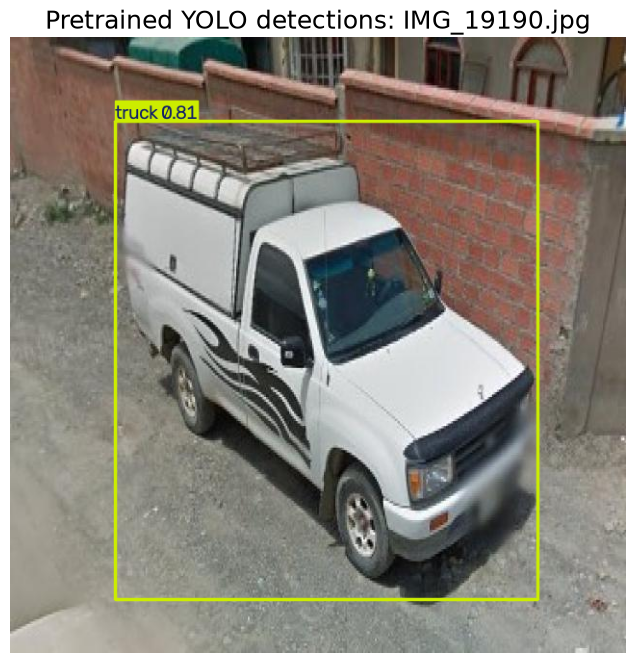


[Image 5/20] IMG_19191.jpg | Inference: 12.7 ms
Detections above confidence threshold: 0
---------------------------------------------------------------------------
No detections above conf=0.25.


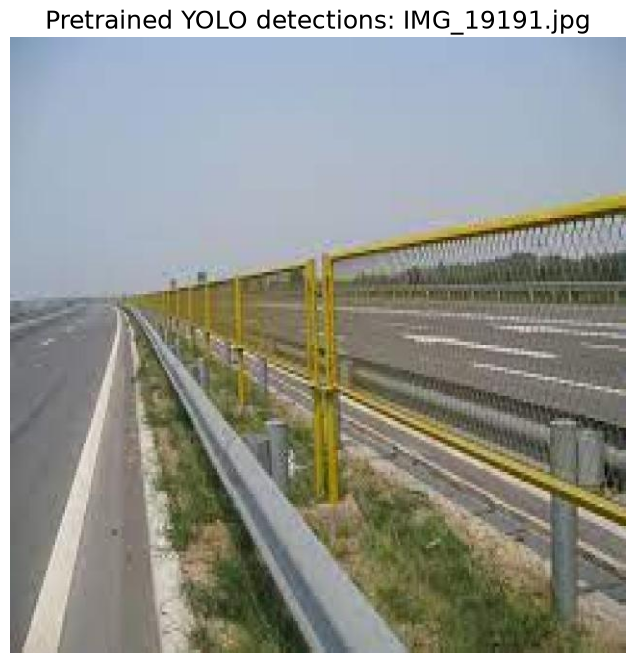


[Image 6/20] IMG_19192.jpg | Inference: 14.5 ms
Detections above confidence threshold: 2
---------------------------------------------------------------------------
01. couch           | class_id=57 | confidence=28.14% | pixel_box=[1, 234, 583, 605] | normalized_box=[0.003, 0.367, 0.912, 0.946] | area=0.5263 (large)
02. potted plant    | class_id=58 | confidence=27.78% | pixel_box=[0, 0, 593, 582] | normalized_box=[0.000, 0.000, 0.927, 0.910] | area=0.8441 (large)

Image summary:
- Total detections: 2
- Mean confidence: 27.96%
- Mean normalized area: 0.6852
- Most frequent detected class: couch (1)


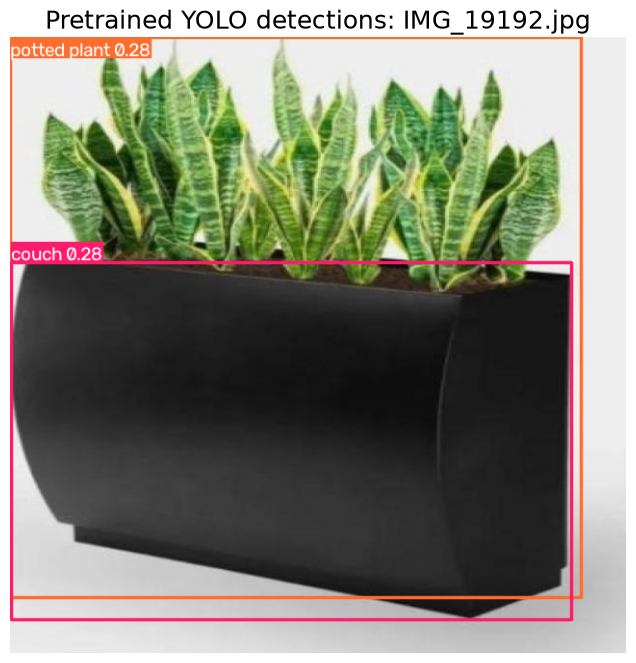


[Image 7/20] IMG_19193.jpg | Inference: 12.4 ms
Detections above confidence threshold: 1
---------------------------------------------------------------------------
01. bowl            | class_id=45 | confidence=32.83% | pixel_box=[5, 1, 625, 631] | normalized_box=[0.008, 0.003, 0.978, 0.986] | area=0.9537 (large)

Image summary:
- Total detections: 1
- Mean confidence: 32.83%
- Mean normalized area: 0.9537
- Most frequent detected class: bowl (1)


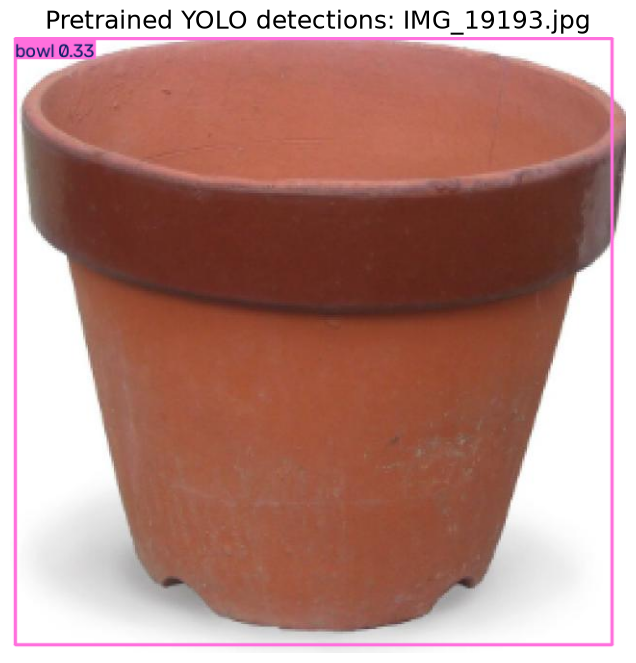


[Image 8/20] IMG_19194.jpg | Inference: 5.4 ms
Detections above confidence threshold: 2
---------------------------------------------------------------------------
01. cup             | class_id=41 | confidence=62.77% | pixel_box=[22, 13, 623, 624] | normalized_box=[0.035, 0.021, 0.975, 0.975] | area=0.8965 (large)
02. vase            | class_id=75 | confidence=38.86% | pixel_box=[37, 14, 597, 590] | normalized_box=[0.059, 0.023, 0.934, 0.923] | area=0.7871 (large)

Image summary:
- Total detections: 2
- Mean confidence: 50.82%
- Mean normalized area: 0.8418
- Most frequent detected class: cup (1)


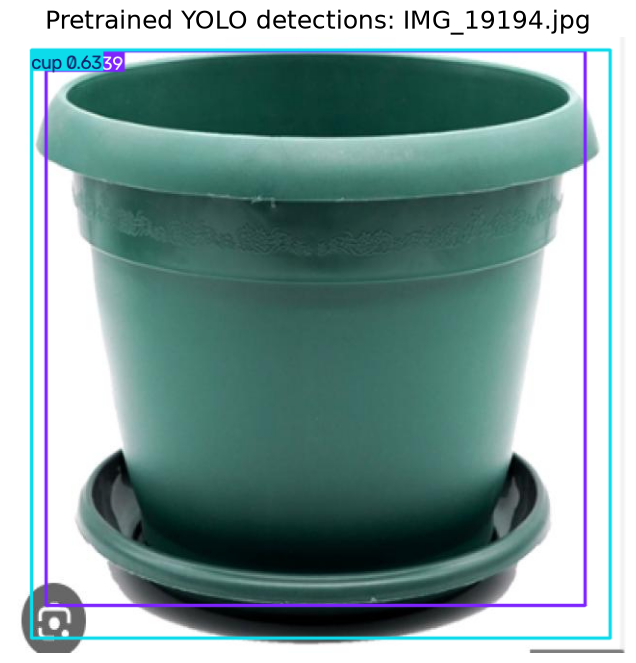


[Image 9/20] IMG_19195.jpg | Inference: 12.3 ms
Detections above confidence threshold: 1
---------------------------------------------------------------------------
01. car             | class_id=2 | confidence=81.17% | pixel_box=[112, 135, 563, 529] | normalized_box=[0.175, 0.212, 0.880, 0.828] | area=0.4340 (large)

Image summary:
- Total detections: 1
- Mean confidence: 81.17%
- Mean normalized area: 0.4340
- Most frequent detected class: car (1)


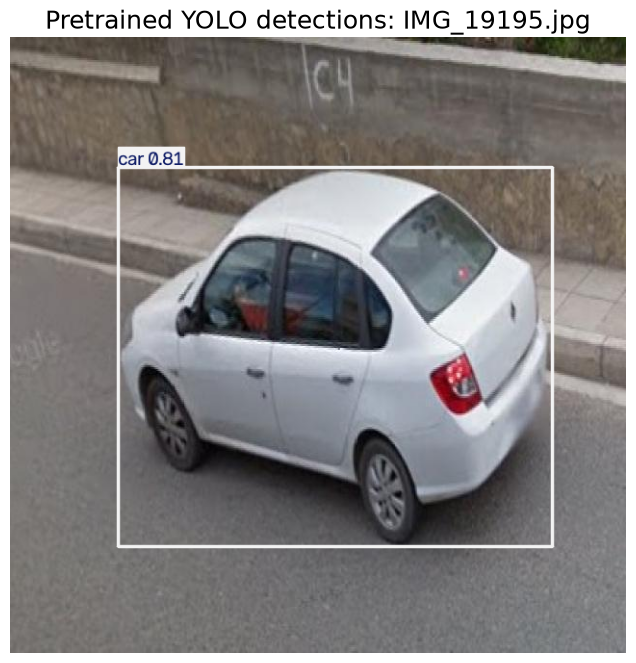


[Image 10/20] IMG_19196.jpg | Inference: 12.9 ms
Detections above confidence threshold: 2
---------------------------------------------------------------------------
01. car             | class_id=2 | confidence=77.27% | pixel_box=[0, 418, 141, 639] | normalized_box=[0.000, 0.655, 0.221, 0.999] | area=0.0760 (large)
02. truck           | class_id=7 | confidence=33.45% | pixel_box=[43, 161, 453, 545] | normalized_box=[0.068, 0.253, 0.708, 0.852] | area=0.3839 (large)

Image summary:
- Total detections: 2
- Mean confidence: 55.36%
- Mean normalized area: 0.2299
- Most frequent detected class: car (1)


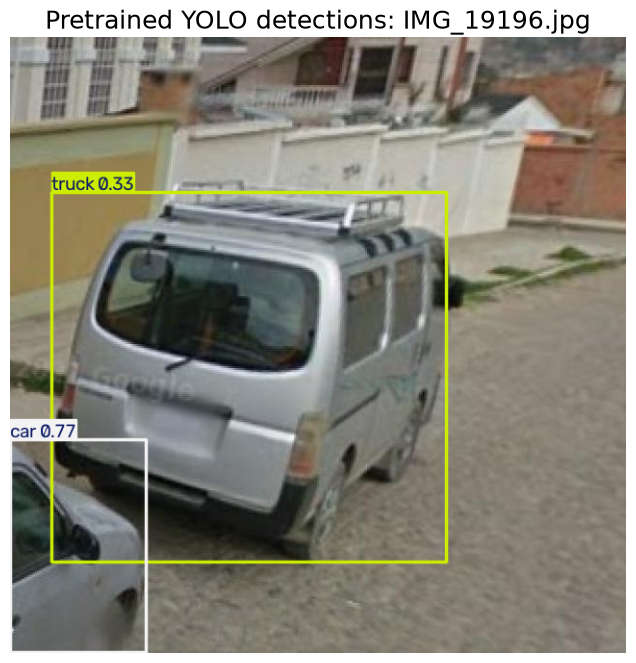


[Image 11/20] IMG_19197.jpg | Inference: 5.8 ms
Detections above confidence threshold: 2
---------------------------------------------------------------------------
01. bus             | class_id=5 | confidence=67.42% | pixel_box=[121, 81, 560, 470] | normalized_box=[0.190, 0.127, 0.876, 0.735] | area=0.4169 (large)
02. bus             | class_id=5 | confidence=44.27% | pixel_box=[18, 79, 506, 501] | normalized_box=[0.029, 0.124, 0.791, 0.784] | area=0.5023 (large)

Image summary:
- Total detections: 2
- Mean confidence: 55.85%
- Mean normalized area: 0.4596
- Most frequent detected class: bus (2)


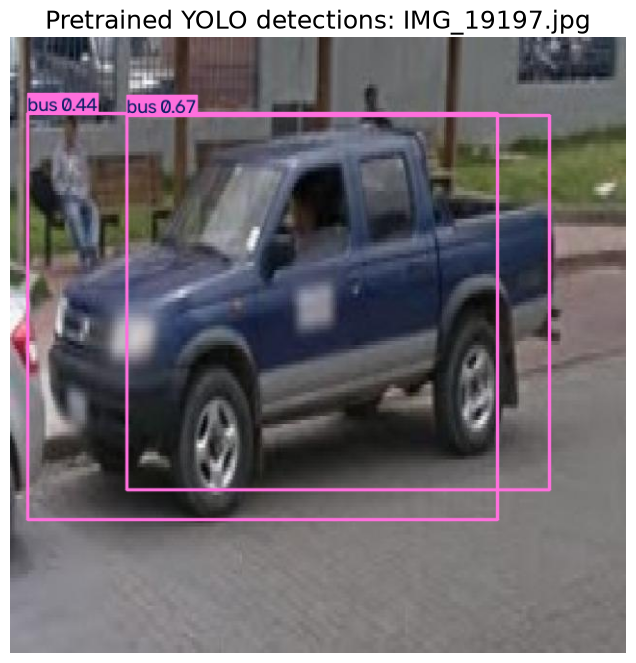


[Image 12/20] IMG_19198.jpg | Inference: 5.0 ms
Detections above confidence threshold: 0
---------------------------------------------------------------------------
No detections above conf=0.25.


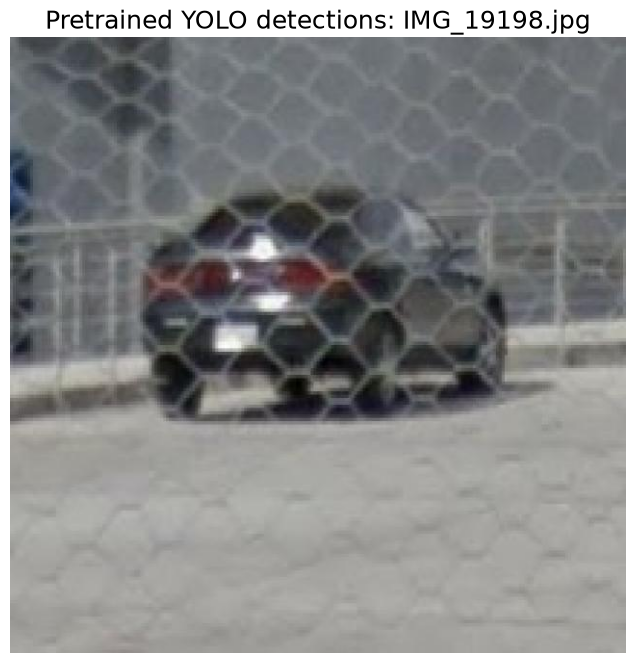


[Image 13/20] IMG_19199.jpg | Inference: 6.2 ms
Detections above confidence threshold: 2
---------------------------------------------------------------------------
01. car             | class_id=2 | confidence=49.05% | pixel_box=[58, 149, 631, 579] | normalized_box=[0.092, 0.234, 0.987, 0.905] | area=0.6006 (large)
02. truck           | class_id=7 | confidence=32.86% | pixel_box=[114, 140, 631, 576] | normalized_box=[0.179, 0.220, 0.987, 0.900] | area=0.5496 (large)

Image summary:
- Total detections: 2
- Mean confidence: 40.95%
- Mean normalized area: 0.5751
- Most frequent detected class: car (1)


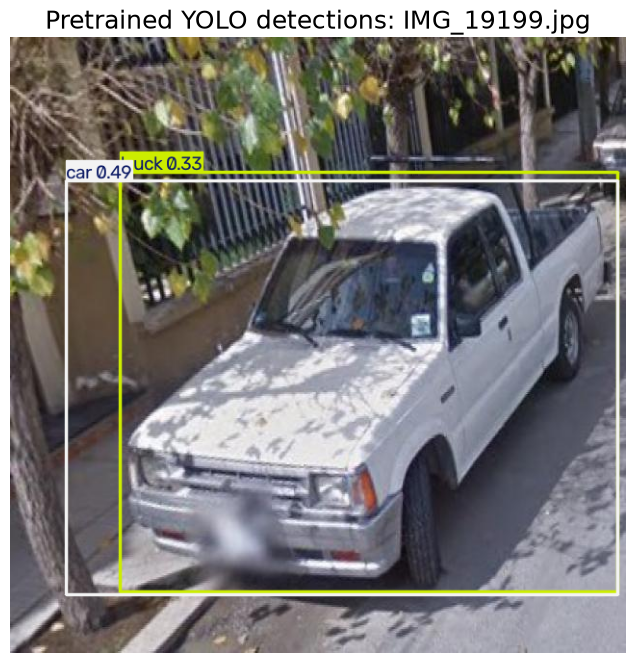


[Image 14/20] IMG_19200.jpg | Inference: 5.9 ms
Detections above confidence threshold: 1
---------------------------------------------------------------------------
01. bus             | class_id=5 | confidence=68.79% | pixel_box=[74, 51, 390, 411] | normalized_box=[0.116, 0.081, 0.611, 0.643] | area=0.2783 (large)

Image summary:
- Total detections: 1
- Mean confidence: 68.79%
- Mean normalized area: 0.2783
- Most frequent detected class: bus (1)


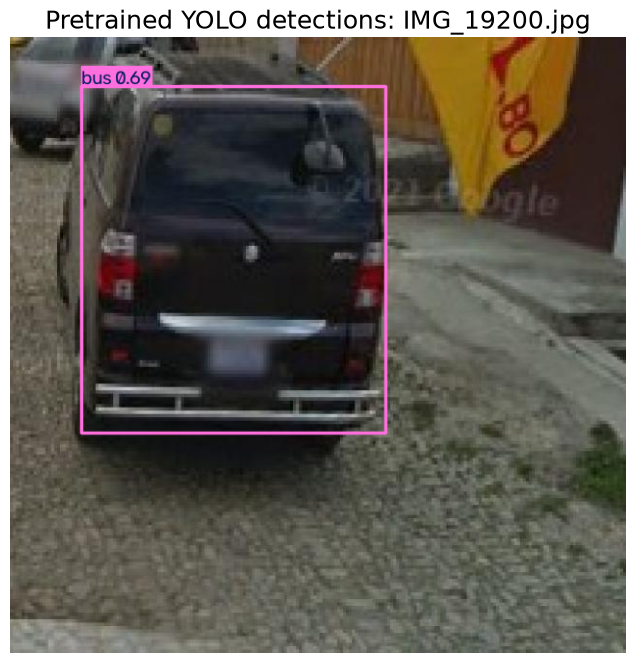


[Image 15/20] IMG_19201.jpg | Inference: 5.6 ms
Detections above confidence threshold: 2
---------------------------------------------------------------------------
01. person          | class_id=0 | confidence=89.07% | pixel_box=[565, 201, 639, 480] | normalized_box=[0.884, 0.315, 0.999, 0.751] | area=0.0503 (large)
02. car             | class_id=2 | confidence=66.92% | pixel_box=[98, 121, 523, 470] | normalized_box=[0.155, 0.190, 0.818, 0.735] | area=0.3618 (large)

Image summary:
- Total detections: 2
- Mean confidence: 78.00%
- Mean normalized area: 0.2061
- Most frequent detected class: person (1)


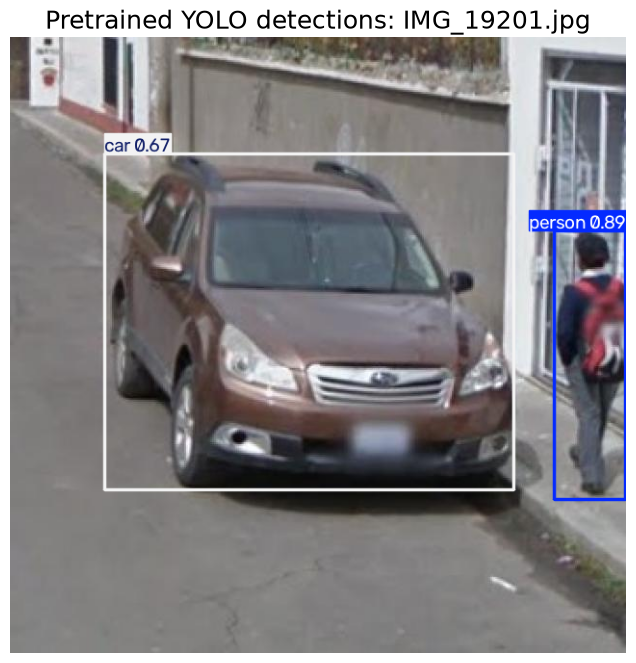


[Image 16/20] IMG_19202.jpg | Inference: 5.5 ms
Detections above confidence threshold: 1
---------------------------------------------------------------------------
01. truck           | class_id=7 | confidence=31.31% | pixel_box=[159, 191, 427, 449] | normalized_box=[0.249, 0.300, 0.668, 0.702] | area=0.1684 (large)

Image summary:
- Total detections: 1
- Mean confidence: 31.31%
- Mean normalized area: 0.1684
- Most frequent detected class: truck (1)


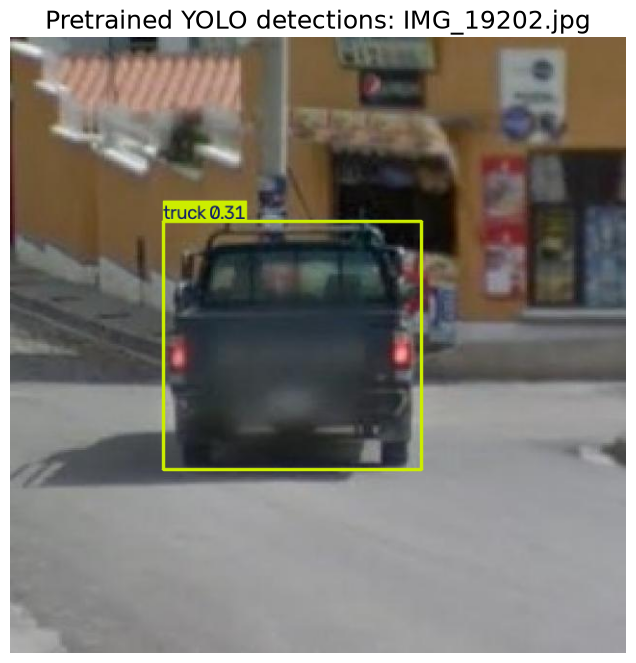


[Image 17/20] IMG_19203.jpg | Inference: 5.7 ms
Detections above confidence threshold: 2
---------------------------------------------------------------------------
01. car             | class_id=2 | confidence=89.74% | pixel_box=[28, 203, 590, 590] | normalized_box=[0.045, 0.319, 0.923, 0.922] | area=0.5301 (large)
02. person          | class_id=0 | confidence=53.48% | pixel_box=[0, 135, 44, 216] | normalized_box=[0.001, 0.211, 0.070, 0.339] | area=0.0088 (small) | near left edge

Image summary:
- Total detections: 2
- Mean confidence: 71.61%
- Mean normalized area: 0.2695
- Most frequent detected class: car (1)


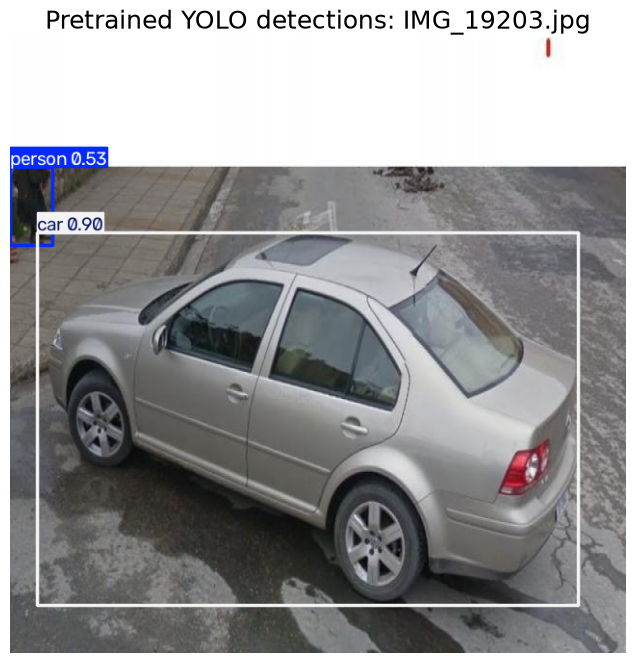


[Image 18/20] IMG_19204.jpg | Inference: 6.3 ms
Detections above confidence threshold: 8
---------------------------------------------------------------------------
01. person          | class_id=0 | confidence=85.47% | pixel_box=[326, 91, 611, 638] | normalized_box=[0.511, 0.144, 0.956, 0.998] | area=0.3804 (large)
02. person          | class_id=0 | confidence=74.86% | pixel_box=[0, 52, 367, 635] | normalized_box=[0.001, 0.081, 0.574, 0.993] | area=0.5228 (large)
03. person          | class_id=0 | confidence=58.07% | pixel_box=[270, 288, 311, 432] | normalized_box=[0.423, 0.451, 0.486, 0.676] | area=0.0142 (medium)
04. person          | class_id=0 | confidence=55.28% | pixel_box=[352, 284, 400, 405] | normalized_box=[0.551, 0.445, 0.625, 0.633] | area=0.0141 (medium)
05. handbag         | class_id=26 | confidence=42.00% | pixel_box=[296, 323, 326, 404] | normalized_box=[0.463, 0.506, 0.510, 0.632] | area=0.0059 (small)
06. person          | class_id=0 | confidence=39.81% | pixel_box=

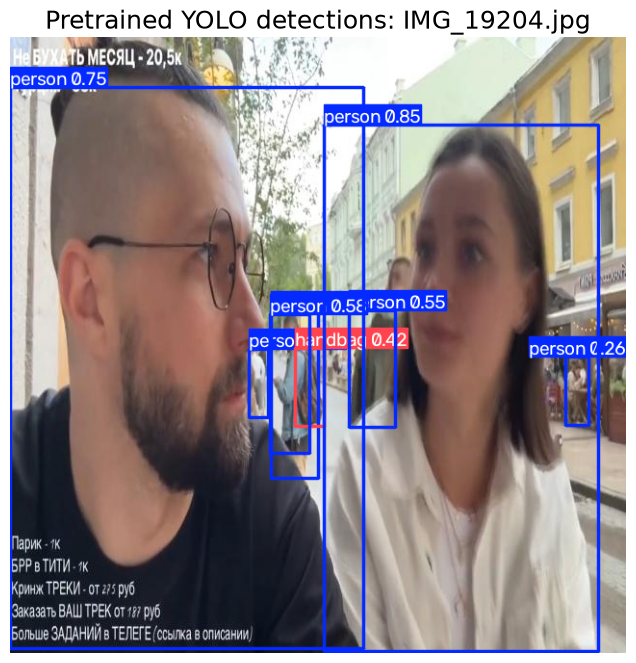


[Image 19/20] IMG_19205.jpg | Inference: 5.4 ms
Detections above confidence threshold: 11
---------------------------------------------------------------------------
01. person          | class_id=0 | confidence=81.59% | pixel_box=[474, 200, 545, 562] | normalized_box=[0.741, 0.313, 0.852, 0.879] | area=0.0633 (large)
02. person          | class_id=0 | confidence=78.61% | pixel_box=[292, 192, 371, 630] | normalized_box=[0.457, 0.301, 0.581, 0.985] | area=0.0848 (large)
03. person          | class_id=0 | confidence=78.36% | pixel_box=[537, 201, 618, 567] | normalized_box=[0.840, 0.314, 0.967, 0.886] | area=0.0726 (large)
04. person          | class_id=0 | confidence=62.23% | pixel_box=[416, 252, 434, 316] | normalized_box=[0.651, 0.394, 0.679, 0.494] | area=0.0028 (small)
05. handbag         | class_id=26 | confidence=50.97% | pixel_box=[468, 253, 491, 346] | normalized_box=[0.732, 0.395, 0.768, 0.541] | area=0.0053 (small)
06. person          | class_id=0 | confidence=49.65% | pixel_b

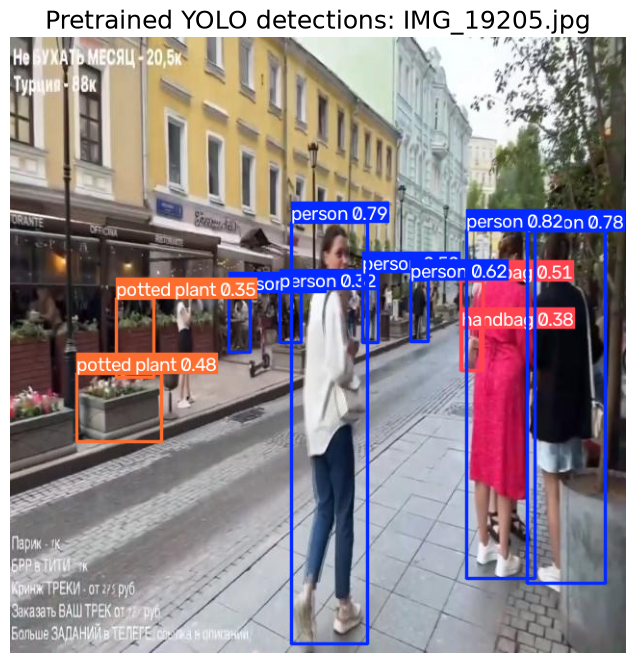


[Image 20/20] IMG_19206.jpg | Inference: 5.1 ms
Detections above confidence threshold: 2
---------------------------------------------------------------------------
01. potted plant    | class_id=58 | confidence=46.63% | pixel_box=[470, 342, 543, 401] | normalized_box=[0.735, 0.534, 0.849, 0.628] | area=0.0107 (medium)
02. person          | class_id=0 | confidence=27.46% | pixel_box=[266, 278, 289, 363] | normalized_box=[0.417, 0.435, 0.452, 0.567] | area=0.0046 (small)

Image summary:
- Total detections: 2
- Mean confidence: 37.05%
- Mean normalized area: 0.0077
- Most frequent detected class: potted plant (1)


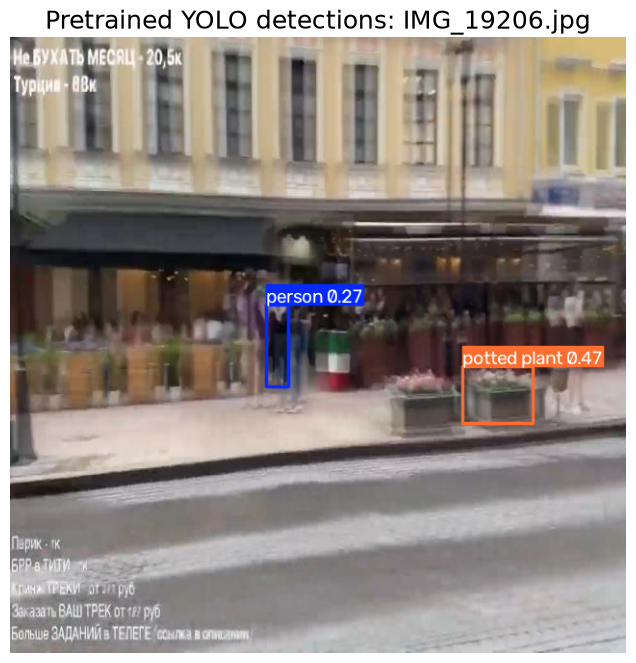

Image IDs saved to: dataset/pretrained_yolo_used_images.csv

OVERALL PRETRAINED YOLO SUMMARY
Images processed: 20
Total detections: 44
Mean confidence: 51.66%
Mean normalized detection area: 0.2681

Most frequently detected classes:
- person         : 18
- car            : 6
- truck          : 6
- potted plant   : 4
- bus            : 3
- handbag        : 3
- couch          : 1
- bowl           : 1
- cup            : 1
- vase           : 1

Interpretation:
- This cell demonstrates qualitative inference using a pretrained model.
- Confidence indicates how strongly the model supports each prediction.
- Normalized area provides a resolution-independent estimate of object size.
- Small objects and uncommon obstacle categories may be missed.
- Fine-tuning on the project dataset is required for reliable task-specific results.


In [17]:
# Import libraries required for inference, image handling, plotting, and summaries.
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

from collections import Counter
from ultralytics import YOLO


# Load a pretrained YOLO model.
# Note: yolov8n.pt is trained on the COCO dataset, not necessarily on the
# Urban Obstacle Detection classes. Therefore, its predictions are useful
# for qualitative exploration but should not be treated as final performance.
model = YOLO("pre-train_yolo/yolov8n.pt")


# Select image files from the test split.
# Filtering by extension prevents accidentally passing label files or other
# non-image files to the model.
test_image_dir = os.path.join(DATASET_ROOT, "test", "images")
image_extensions = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp")

sample_images = [
    filename
    for filename in sorted(os.listdir(test_image_dir))
    if filename.lower().endswith(image_extensions)
][:20]

print(f"Selected {len(sample_images)} test images for pretrained-model exploration.")


# Variables used to accumulate statistics across all sampled images.
overall_counts = Counter()       # Number of detections grouped by class name
overall_confidences = []         # Confidence score for every detection
overall_areas = []               # Normalized area for every detection

images_processed = 0
total_detections = 0

# Store the image IDs used for pretrained YOLO inference.
used_image_ids = []


# Run inference independently on every sampled image.
for index, image_name in enumerate(sample_images, start=1):
    # Store the filename and its identifier.
    used_image_ids.append({
        "image_id": os.path.splitext(image_name)[0],
        "image_name": image_name,
        "image_path": os.path.join(test_image_dir, image_name)
    })

    image_path = os.path.join(test_image_dir, image_name)

    # conf=0.25 removes predictions with confidence below 25%.
    # verbose=False keeps the notebook output readable.
    results = model.predict(
        source=image_path,
        conf=0.25,
        verbose=False
    )

    result = results[0]
    boxes = result.boxes

    # Extract prediction data from Ultralytics tensors.
    # Calling .cpu() makes this work whether inference ran on CPU or GPU.
    if boxes is not None and len(boxes) > 0:
        class_ids = boxes.cls.cpu().numpy().astype(int)
        confidences = boxes.conf.cpu().numpy()
        pixel_boxes = boxes.xyxy.cpu().numpy()
        normalized_boxes = boxes.xyxyn.cpu().numpy()
        normalized_center_boxes = boxes.xywhn.cpu().numpy()
    else:
        # Use correctly shaped empty arrays when no objects are detected.
        class_ids = np.empty(0, dtype=int)
        confidences = np.empty(0, dtype=float)
        pixel_boxes = np.empty((0, 4), dtype=float)
        normalized_boxes = np.empty((0, 4), dtype=float)
        normalized_center_boxes = np.empty((0, 4), dtype=float)

    # Ultralytics usually returns class names as a dictionary.
    # Converting them to a helper function makes the code work with either
    # dictionary-based or list-based class-name mappings.
    class_names = result.names

    def get_class_name(class_id):
        if isinstance(class_names, dict):
            return class_names.get(int(class_id), f"class_{class_id}")
        return class_names[int(class_id)]

    detection_count = len(class_ids)
    images_processed += 1
    total_detections += detection_count

    # Inference time may not exist in every Ultralytics version.
    inference_time = result.speed.get("inference", float("nan"))

    print("\n" + "=" * 75)
    print(
        f"[Image {index}/{len(sample_images)}] {image_name} | "
        f"Inference: {inference_time:.1f} ms"
    )
    print(f"Detections above confidence threshold: {detection_count}")
    print("-" * 75)

    if detection_count == 0:
        print("No detections above conf=0.25.")
    else:
        image_counts = Counter()
        image_confidences = []
        image_areas = []

        # Print and summarize every detected object in the current image.
        for detection_index, (class_id, confidence) in enumerate(
            zip(class_ids, confidences),
            start=1
        ):
            class_name = get_class_name(class_id)

            # Update class and confidence summaries.
            image_counts[class_name] += 1
            overall_counts[class_name] += 1

            confidence = float(confidence)
            image_confidences.append(confidence)
            overall_confidences.append(confidence)

            # Pixel coordinates are formatted as:
            # [x_min, y_min, x_max, y_max]
            x1, y1, x2, y2 = pixel_boxes[detection_index - 1]

            # Normalized corner coordinates use values between 0 and 1.
            nx1, ny1, nx2, ny2 = normalized_boxes[detection_index - 1]

            # Normalized center-format coordinates are:
            # [center_x, center_y, width, height]
            center_x, center_y, width, height = (
                normalized_center_boxes[detection_index - 1]
            )

            # Normalized area estimates how much of the image the object occupies.
            normalized_area = float(width * height)
            image_areas.append(normalized_area)
            overall_areas.append(normalized_area)

            # These thresholds are simple descriptive categories, not official
            # COCO or YOLO definitions.
            if normalized_area < 0.01:
                size_category = "small"
            elif normalized_area < 0.05:
                size_category = "medium"
            else:
                size_category = "large"

            # Identify objects whose center is close to an image boundary.
            border_locations = []

            if center_x < 0.05:
                border_locations.append("left edge")
            if center_x > 0.95:
                border_locations.append("right edge")
            if center_y < 0.05:
                border_locations.append("top edge")
            if center_y > 0.95:
                border_locations.append("bottom edge")

            border_description = (
                f" | near {', '.join(border_locations)}"
                if border_locations
                else ""
            )

            print(
                f"{detection_index:02d}. {class_name:<15} "
                f"| class_id={class_id} "
                f"| confidence={confidence:.2%} "
                f"| pixel_box=[{int(x1)}, {int(y1)}, {int(x2)}, {int(y2)}] "
                f"| normalized_box=[{nx1:.3f}, {ny1:.3f}, "
                f"{nx2:.3f}, {ny2:.3f}] "
                f"| area={normalized_area:.4f} "
                f"({size_category}){border_description}"
            )

        # Image-level statistics summarize all predictions in this image.
        mean_confidence = np.mean(image_confidences)
        mean_area = np.mean(image_areas)
        dominant_class, dominant_count = image_counts.most_common(1)[0]

        print("\nImage summary:")
        print(f"- Total detections: {detection_count}")
        print(f"- Mean confidence: {mean_confidence:.2%}")
        print(f"- Mean normalized area: {mean_area:.4f}")
        print(f"- Most frequent detected class: {dominant_class} ({dominant_count})")

    # Draw YOLO's predicted bounding boxes and class labels on the image.
    # result.plot() returns a BGR image, so it must be converted to RGB before
    # displaying it with Matplotlib.
    plotted_image = result.plot()

    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(plotted_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Pretrained YOLO detections: {image_name}")
    plt.axis("off")
    plt.show()


# Save the image IDs for future reference.
used_images_df = pd.DataFrame(used_image_ids)
used_images_path = os.path.join(DATASET_ROOT, "pretrained_yolo_used_images.csv")
used_images_df.to_csv(used_images_path, index=False)

print(f"Image IDs saved to: {used_images_path}")


# Print a summary covering all processed images.
print("\n" + "=" * 75)
print("OVERALL PRETRAINED YOLO SUMMARY")
print("=" * 75)
print(f"Images processed: {images_processed}")
print(f"Total detections: {total_detections}")

if overall_confidences:
    print(f"Mean confidence: {np.mean(overall_confidences):.2%}")

if overall_areas:
    print(f"Mean normalized detection area: {np.mean(overall_areas):.4f}")

print("\nMost frequently detected classes:")
if overall_counts:
    for class_name, count in overall_counts.most_common(10):
        print(f"- {class_name:<15}: {count}")
else:
    print("- No detections were produced.")

print("=" * 75)

print(
    "\nInterpretation:\n"
    "- This cell demonstrates qualitative inference using a pretrained model.\n"
    "- Confidence indicates how strongly the model supports each prediction.\n"
    "- Normalized area provides a resolution-independent estimate of object size.\n"
    "- Small objects and uncommon obstacle categories may be missed.\n"
    "- Fine-tuning on the project dataset is required for reliable task-specific results."
)

### Observations

The pretrained YOLOv8n model provides a useful qualitative baseline for understanding how a general-purpose object detector performs on urban-scene images.

- The model recognizes several common COCO categories, including people, cars, buses, trucks, bicycles, and traffic-related objects.
- Predictions are not directly comparable with the dataset ground-truth classes because the pretrained model was not trained on the Urban Obstacle Detection dataset.
- Detection quality varies depending on object size, image brightness, occlusion, viewpoint, and background complexity.
- Large and common objects are generally easier to detect than small, distant, partially hidden, or uncommon obstacles.
- Some project-specific obstacle categories may be missed entirely because they are absent from the COCO label set.
- Confidence scores describe the model's prediction certainty; they do not represent accuracy because ground-truth matching has not been performed in this cell.
- Bounding-box area analysis shows how the model responds to objects at different scales. Small detections are particularly important for assistive-vision systems because distant obstacles may still represent potential hazards.
- Predictions near image borders may be incomplete because objects can be partially outside the camera frame.
- The visualization is therefore intended for qualitative inspection rather than formal model evaluation.

Overall, this experiment demonstrates the limitations of transferring a general-purpose model to a specialized urban-obstacle task. Fine-tuning YOLO on the project dataset, followed by evaluation using precision, recall, mAP50, and mAP50-95, would be required to measure task-specific performance reliably.

# Key Takeaways

1. The dataset contains **24,326 images** collected from diverse real-world urban environments, providing a substantial foundation for computer-vision research.

2. The dataset includes **25 object classes** and more than **40,000 annotated objects**, covering pedestrians, vehicles, street furniture, road features, and other potential obstacles.

3. Class frequencies follow a pronounced **long-tail distribution**. Common classes such as Person and Car are heavily represented, while rare classes may require class-balanced sampling, targeted augmentation, or weighted training.

4. Object sizes vary considerably. The dataset contains both small, distant obstacles and large foreground objects, making multi-scale feature extraction and appropriate input resolution important.

5. Images range from simple scenes with only a few objects to highly cluttered environments containing many simultaneous obstacles. This variation reflects realistic urban complexity.

6. Spatial analysis indicates that object locations are not uniformly distributed. Many objects appear in predictable regions associated with pedestrian viewpoints, roads, sidewalks, and the lower part of the camera frame.

7. The brightness analysis demonstrates substantial variation in illumination and exposure. Models should therefore be tested under dark, normal, and brightly lit conditions.

8. Image-label integrity checks found matching image and label files across the train, validation, and test partitions, with no missing or orphan label files detected.

9. Qualitative visualizations confirm that the dataset contains varied viewpoints, backgrounds, object shapes, bounding boxes, and segmentation polygons. This diversity can improve model robustness but also increases localization difficulty.

10. Predictions from the pretrained YOLOv8n model are useful for qualitative exploration only. Because the model was trained on COCO rather than this project dataset, its predictions cannot be used as task-specific performance results.

11. Reliable evaluation requires fine-tuning a detector on the project annotations and reporting metrics such as precision, recall, mAP50, and mAP50-95.

12. Overall, the dataset is well suited for research into real-time urban obstacle detection, assistive navigation, pedestrian safety, and mobile computer-vision systems.

# Conclusion

The Urban Obstacle Detection Dataset is a substantial and practically relevant benchmark for developing computer-vision systems that identify obstacles in real-world urban environments. With **24,326 images**, **25 object classes**, and more than **40,000 annotations**, it provides broad coverage of pedestrians, vehicles, road features, street furniture, and other objects relevant to pedestrian safety and assistive navigation.

The exploratory analysis identified several important dataset characteristics. Class frequencies follow a pronounced long-tail distribution, scene complexity varies from isolated objects to highly crowded environments, and bounding-box dimensions cover both small distant obstacles and large foreground objects. The images also contain considerable variation in viewpoint, background, brightness, and exposure, which reflects the conditions a mobile or wearable vision system may encounter in practice.

Spatial analysis indicates that objects are not distributed uniformly throughout the image. Many annotations appear in regions associated with roads, sidewalks, pedestrian viewpoints, and the lower part of the camera frame. This information can help explain model behavior, identify potential dataset biases, and guide future error analysis.

The image-label integrity checks found matching image and label files across the training, validation, and test splits, with no missing or orphan labels detected. Qualitative visualizations further confirmed the diversity of scenes and the presence of both bounding-box and segmentation annotations.

The pretrained YOLOv8n experiment provides a useful qualitative reference, but its predictions should not be interpreted as task-specific performance because the model was trained on COCO rather than this dataset. A reliable evaluation requires training or fine-tuning a detector using the project annotations and reporting metrics such as precision, recall, mAP50, and mAP50-95. Performance should also be analyzed by object class, object size, scene density, and illumination condition.

Future work should focus on addressing class imbalance, improving detection of small and rare obstacles, applying carefully selected data augmentation, and comparing lightweight and high-capacity detector architectures. Additional testing under difficult conditions such as low illumination, occlusion, motion blur, and crowded scenes would provide a more realistic assessment of deployment readiness.

Overall, this dataset offers a strong foundation for research and development in real-time urban obstacle detection, pedestrian safety, assistive navigation, mobile computer vision, and intelligent transportation applications.